# Differential accessibility on pseudobulk with replicates

In [2]:
here::i_am("rna/mapping/run/mnn/mapping_mnn.R")

# Load default settings
source(here::here("settings.R"))
source(here::here("utils.R"))

# Load packages
suppressPackageStartupMessages(library(scran))
suppressPackageStartupMessages(library(scater))
suppressPackageStartupMessages(library(edgeR))
suppressPackageStartupMessages(library(org.Mm.eg.db))


here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/code



In [3]:
args = list()
args$sce = file.path(io$basedir, 'results/atac/archR/pseudobulk/celltype_genotype/PeakMatrix/PeakMatrix_pseudobulk_with_replicates.rds')
args$atac_matrix_file = file.path(io$basedir, 'processed/atac/archR/Matrices/PeakMatrix_summarized_experiment.rds')
args$groupA = 'wt'
args$groupB = 'eomes_ko'
args$celltypes = opts$celltypes
args$outdir = file.path(io$basedir, 'results/atac/archR/differential')

args$archr_directory = file.path(io$basedir, 'processed/atac/archR')
args$metadata = file.path(io$basedir, 'results/atac/archR/qc/sample_metadata_after_qc.txt.gz')

In [4]:

dir.create(args$outdir, showWarnings = F)

# Define groups
opts$groups <- c(args$groupA,args$groupB)

opts$min_cdr <- 0.15

In [5]:
atac.mtx = readRDS(args$atac_matrix_file)

In [6]:
assayNames(atac.mtx)[1] <- "counts"

In [7]:
###############
## Load data ##
###############

print(sprintf("Fetching ATAC matrix: '%s'...",args$atac_matrix_file))

atac.se <- readRDS(args$sce)
assayNames(atac.se)[1] <- "counts"

# Normalise with log2 counts (for consistentcy with edgeR)
logcounts(atac.se) <- log2(1e6*(sweep(counts(atac.se),2,colSums(counts(atac.se)),"/"))+1)

# parse
if (!"celltype" %in% colnames(colData(atac.se))) {
  atac.se$celltype <- colnames(atac.se) %>% strsplit("-") %>% map_chr(1)
}
if (!"genotype" %in% colnames(colData(atac.se))) {
  atac.se$genotype <- colnames(atac.se) %>% strsplit("-") %>% map_chr(2) %>% strsplit("_rep") %>% map_chr(1)
}
if (!"celltype_genotype" %in% colnames(colData(atac.se))) {
  atac.se$celltype_genotype <- sprintf("%s_%s",atac.se$celltype,atac.se$genotype)
}

# temporary (otherwise subsetting doesn't work???)
if ("start" %in% colnames(rowData(atac.se))) {
  rowData(atac.se)$start <- NULL
}
if ("end" %in% colnames(rowData(atac.se))) {
  rowData(atac.se)$end <- NULL
}

[1] "Fetching ATAC matrix: '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/Matrices/PeakMatrix_summarized_experiment.rds'..."


In [8]:
atac.se_full = atac.se

# Ricard's method:

In [8]:
DARs = lapply(args$celltypes, function(ct){
    print(ct)
    tmp <- sprintf("%s_%s",ct,opts$groups)
    if (any(!tmp%in%unique(atac.se_full$celltype_genotype))) {
      warning("...")
      out <- data.table(feature=NA, logFC=NA, padj_fdr=NA, mean_groupA=NA, mean_groupB=NA)
      #fwrite(out, args$outfile, sep="\t", na="NA", quote=F)
    } else {
      atac.se <- atac.se_full[,atac.se_full$celltype %in% ct]
    

        # # subset genotypes
        stopifnot(opts$groups%in%atac.se$genotype)
        atac.se$genotype <- factor(atac.se$genotype, levels=opts$groups)
        print(table(atac.se$celltype_genotype))

        ##################################
        ## calculate feature statistics ##
        ##################################
        # using original single-cell data to determine detection rate

        atac.mtx_tmp <- atac.mtx[,atac.mtx$celltype %in% ct]
        stopifnot(opts$groups%in%atac.mtx_tmp$genotype)
        atac.mtx_tmp$genotype <- factor(atac.mtx_tmp$genotype, levels=opts$groups)
        print(table(atac.mtx_tmp$celltype_genotype))
        
        acc.dt <- data.table(
          feature = rownames(atac.mtx_tmp),
          detection_rate_groupA = rowMeans(assay(atac.mtx_tmp,"counts")[,colData(atac.mtx_tmp)$genotype==opts$groups[1]]>0) %>% round(2),
          detection_rate_groupB = rowMeans(assay(atac.mtx_tmp,"counts")[,colData(atac.mtx_tmp)$genotype==opts$groups[2]]>0) %>% round(2),
          mean_groupA = rowMeans(logcounts(atac.se[,atac.se$genotype==args$groupA])) %>% round(2),
          mean_groupB = rowMeans(logcounts(atac.se[,atac.se$genotype==args$groupB])) %>% round(2)
        )

        #####################################
        ## Differential testing with edgeR ##
        #####################################

        # Consider only features that have a minimum detection rate
        features.to.use <- acc.dt[detection_rate_groupA>=opts$min_cdr | detection_rate_groupB>=opts$min_cdr,feature]

        # Create DGEList
        atac.dge <- DGEList(assay(atac.se[features.to.use,],"counts"))

        # Define design matrix (with intercept)
        design <- model.matrix(~atac.se$genotype)

        # Estimate dispersions
        atac.dge <- estimateDisp(atac.dge,design)

        # Fit GLM
        fit <- glmQLFit(atac.dge,design)

        # Likelihood ratio test
        lrt <- glmQLFTest(fit)

        # Construct output data.frame
        out <- topTags(lrt, n=nrow(lrt))$table %>% as.data.table(keep.rownames=T) %>%
            setnames(c("feature","logFC","logCPM","LR","p.value","padj_fdr")) %>%
            .[,c("logCPM","LR","p.value"):=NULL] %>%
          merge(acc.dt[,c("feature","mean_groupA","mean_groupB")], by="feature", all.y=TRUE) %>%
            .[,c("padj_fdr","logFC"):=list(signif(padj_fdr,digits=3),round(logFC,3))] %>%
            .[is.na(logFC),c("logFC","padj_fdr"):=list(0,1)] %>%
            setorder(padj_fdr, na.last=T)

    }
    out = out %>% .[,celltype:=ct]
    return(out)
})

[1] "Epiblast"


Warning message in FUN(X[[i]], ...):
“...”


[1] "Primitive_Streak"

Primitive_Streak_eomes_ko       Primitive_Streak_wt 
                        5                         5 

Primitive_Streak-eomes_ko       Primitive_Streak-wt 
                      364                      4216 
[1] "Caudal_epiblast"


Warning message in FUN(X[[i]], ...):
“...”


[1] "PGC"

PGC_eomes_ko       PGC_wt 
           5            5 

PGC-eomes_ko       PGC-wt 
         233          219 
[1] "Anterior_Primitive_Streak"

Anterior_Primitive_Streak_eomes_ko       Anterior_Primitive_Streak_wt 
                                 5                                  5 

Anterior_Primitive_Streak-eomes_ko       Anterior_Primitive_Streak-wt 
                                34                                411 
[1] "Notochord"


Warning message in FUN(X[[i]], ...):
“...”


[1] "Def._endoderm"


Warning message in FUN(X[[i]], ...):
“...”


[1] "Gut"


Warning message in FUN(X[[i]], ...):
“...”


[1] "Nascent_mesoderm"

Nascent_mesoderm_eomes_ko       Nascent_mesoderm_wt 
                        5                         5 

Nascent_mesoderm-eomes_ko       Nascent_mesoderm-wt 
                     1934                      6021 
[1] "Mixed_mesoderm"

Mixed_mesoderm_eomes_ko       Mixed_mesoderm_wt 
                      5                       5 

Mixed_mesoderm-eomes_ko       Mixed_mesoderm-wt 
                    697                    2630 
[1] "Intermediate_mesoderm"

Intermediate_mesoderm_eomes_ko       Intermediate_mesoderm_wt 
                             5                              5 

Intermediate_mesoderm-eomes_ko       Intermediate_mesoderm-wt 
                          1010                            376 
[1] "Caudal_Mesoderm"


Warning message in FUN(X[[i]], ...):
“...”


[1] "Paraxial_mesoderm"


Warning message in FUN(X[[i]], ...):
“...”


[1] "Somitic_mesoderm"


Warning message in FUN(X[[i]], ...):
“...”


[1] "Pharyngeal_mesoderm"

Pharyngeal_mesoderm_eomes_ko       Pharyngeal_mesoderm_wt 
                           5                            5 

Pharyngeal_mesoderm-eomes_ko       Pharyngeal_mesoderm-wt 
                          72                          202 
[1] "Cardiomyocytes"


Warning message in FUN(X[[i]], ...):
“...”


[1] "Allantois"

Allantois_eomes_ko       Allantois_wt 
                 5                  5 

Allantois-eomes_ko       Allantois-wt 
              2493                720 
[1] "ExE_mesoderm"

ExE_mesoderm_eomes_ko       ExE_mesoderm_wt 
                    5                     5 

ExE_mesoderm-eomes_ko       ExE_mesoderm-wt 
                 3670                  1320 
[1] "Mesenchyme"

Mesenchyme_eomes_ko       Mesenchyme_wt 
                  5                   5 

Mesenchyme-eomes_ko       Mesenchyme-wt 
                272                1097 
[1] "Haematoendothelial_progenitors"

Haematoendothelial_progenitors_eomes_ko       Haematoendothelial_progenitors_wt 
                                      5                                       5 

Haematoendothelial_progenitors-eomes_ko       Haematoendothelial_progenitors-wt 
                                    624                                    1888 
[1] "Endothelium"

Endothelium_eomes_ko       Endothelium_wt 
                 

Warning message in FUN(X[[i]], ...):
“...”


[1] "Blood_progenitors_2"


Warning message in FUN(X[[i]], ...):
“...”


[1] "Erythroid1"


Warning message in FUN(X[[i]], ...):
“...”


[1] "Erythroid2"


Warning message in FUN(X[[i]], ...):
“...”


[1] "Erythroid3"


Warning message in FUN(X[[i]], ...):
“...”


[1] "NMP"


Warning message in FUN(X[[i]], ...):
“...”


[1] "Rostral_neurectoderm"


Warning message in FUN(X[[i]], ...):
“...”


[1] "Caudal_neurectoderm"


Warning message in FUN(X[[i]], ...):
“...”


[1] "Neural_crest"


Warning message in FUN(X[[i]], ...):
“...”


[1] "Forebrain_Midbrain_Hindbrain"

Forebrain_Midbrain_Hindbrain_eomes_ko       Forebrain_Midbrain_Hindbrain_wt 
                                    5                                     5 

Forebrain_Midbrain_Hindbrain-eomes_ko       Forebrain_Midbrain_Hindbrain-wt 
                                   32                                    26 
[1] "Spinal_cord"


Warning message in FUN(X[[i]], ...):
“...”


[1] "Surface_ectoderm"

Surface_ectoderm_eomes_ko       Surface_ectoderm_wt 
                        5                         5 

Surface_ectoderm-eomes_ko       Surface_ectoderm-wt 
                      518                       303 
[1] "Visceral_endoderm"


Warning message in FUN(X[[i]], ...):
“...”


[1] "ExE_endoderm"


Warning message in FUN(X[[i]], ...):
“...”


[1] "ExE_ectoderm"


Warning message in FUN(X[[i]], ...):
“...”


[1] "Parietal_endoderm"


Warning message in FUN(X[[i]], ...):
“...”


In [9]:
DARs = rbindlist(DARs)

In [14]:
test = DARs[, sig:=ifelse(abs(logFC)>0.5 & padj_fdr<0.05, TRUE, FALSE)]
table(test[sig==TRUE & logFC>0]$celltype)
table(test[sig==TRUE & logFC<0]$celltype)


                     Allantois      Anterior_Primitive_Streak 
                          2547                           8430 
                   Endothelium                   ExE_mesoderm 
                          5064                            860 
  Forebrain_Midbrain_Hindbrain Haematoendothelial_progenitors 
                         14669                           4669 
         Intermediate_mesoderm                     Mesenchyme 
                          2771                           5491 
                Mixed_mesoderm               Nascent_mesoderm 
                          1371                            976 
                           PGC            Pharyngeal_mesoderm 
                          2864                           7328 
              Primitive_Streak               Surface_ectoderm 
                          1422                           2247 


                     Allantois      Anterior_Primitive_Streak 
                           752                           8793 
                   Endothelium                   ExE_mesoderm 
                          3497                            346 
  Forebrain_Midbrain_Hindbrain Haematoendothelial_progenitors 
                         10052                           1091 
         Intermediate_mesoderm                     Mesenchyme 
                          1008                           2568 
                Mixed_mesoderm               Nascent_mesoderm 
                          1075                            838 
                           PGC            Pharyngeal_mesoderm 
                          2272                           3885 
              Primitive_Streak               Surface_ectoderm 
                          1322                            957 

In [15]:
test = test[,sign:=ifelse(logFC>0, 'pos', 'neg')]

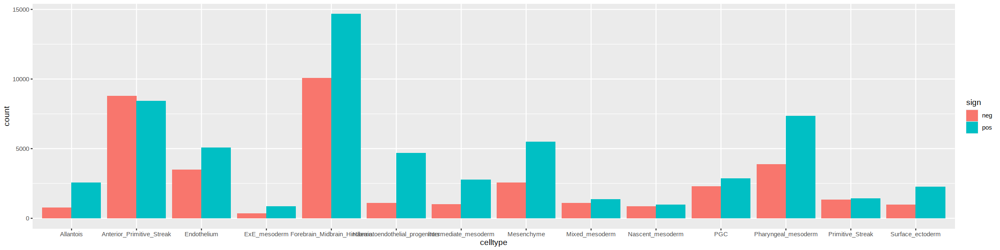

In [17]:
options(repr.plot.width=20, repr.plot.height=5) 

ggplot(test[sig==TRUE], aes(celltype, fill=sign)) + geom_bar(position='dodge')

In [19]:
plot_DEGs = function(ct, nlabels=10){
    DEG_tmp = DARs[celltype==ct & logFC!=0,] %>%
        .[, sig:=ifelse(abs(logFC)>1 & padj_fdr<0.05, TRUE, FALSE)]

    if(nrow(DEG_tmp)>1){
    labels_up = DEG_tmp[sig==TRUE & logFC>0,] %>% .[order(-logFC),] %>% head(nlabels)
    labels_down = DEG_tmp[sig==TRUE & logFC<0,] %>% .[order(logFC),] %>% head(nlabels)
    labels = rbind(labels_up, labels_down)
    
    xlim = max(abs(DEG_tmp$logFC))
    
    text = data.frame(dir=c('Up', 'Down'), 
                  feature=c(nrow(DEG_tmp[sig==TRUE & logFC>0,]), 
                          nrow(DEG_tmp[sig==TRUE & logFC<0,])),
                  logFC = c(xlim, -xlim), 
                  padj_fdr = min(DEG_tmp$padj_fdr),
                     sig=c('FALSE', 'FALSE'))
    
    DEG_plot = ggplot(DEG_tmp, aes(logFC, -log10(padj_fdr), col=sig, label=feature)) + 
        geom_point() + 
        geom_text(data=text, aes(logFC, -log10(padj_fdr), label=feature), size=8) + 
        xlim(-xlim, xlim) + 
        scale_color_manual(values=c('TRUE'='red', 'FALSE'='black')) + 
        geom_vline(xintercept = 0, col='red', linetype='dotted') +
        ggrepel::geom_text_repel(data=labels, 
                                 col='black', 
                                 max.overlaps=Inf,
                                 box.padding = 0.5) + 
        ggtitle(paste0(ct, ' - ', nrow(DEG_tmp), ' peaks')) +
        theme_bw() + 
        theme(#text=element_text(size=15),
             legend.position='none')
    return(DEG_plot)

    }
}


In [20]:
celltypes_keep = unique(DARs[!is.na(feature),celltype])

In [21]:
DEG_plots = lapply(args$celltypes, plot_DEGs, nlabels=0)
names(DEG_plots) = args$celltypes

DEG_plots_filt = list()

for(i in celltypes_keep){
DEG_plots_filt[[i]] = DEG_plots[[i]]
}

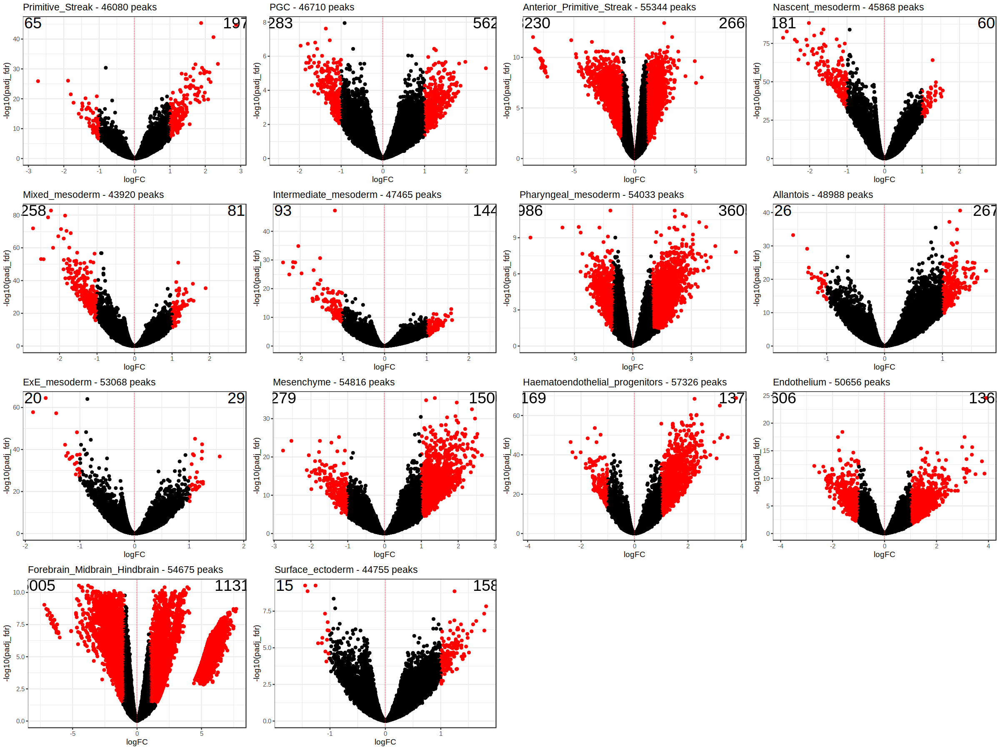

In [22]:
options(repr.plot.width=20, repr.plot.height=15) 
ggarrange(plotlist=DEG_plots_filt)

# ArchR

In [8]:
suppressPackageStartupMessages(library(ArchR))
setwd(args$archr_directory)

addArchRVerbose(verbose = FALSE)
addArchRGenome("mm10")

Setting addArchRVerbose = FALSE

Setting default genome to Mm10.



In [9]:
########################
## Load cell metadata ##
########################

cell_metadata.dt <- fread(args$metadata) %>%
  .[pass_atacQC==TRUE & doublet_call==FALSE]

## Load ArchRProject
# Subset
ArchRProject <- loadArchRProject(args$archr_directory)[cell_metadata.dt$cell]

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

In [10]:
meta = as.data.table(ArchRProject@cellColData)

features = rownames(atac.mtx)

In [11]:
keep = rownames(ArchRProject@cellColData)

In [12]:
atac.mtx = atac.mtx[,keep]

In [13]:
table(ArchRProject@cellColData$celltype, ArchRProject@cellColData$genotype)

                                
                                 eomes_ko   wt
  Allantois                          2493  720
  Anterior_Primitive_Streak            34  411
  Blood_progenitors_1                   0   86
  Blood_progenitors_2                   0  138
  Caudal_epiblast                      30   19
  Caudal_Mesoderm                       1    2
  Def._endoderm                        29   19
  Endothelium                         222  194
  Epiblast                              2  678
  Erythroid1                            0   91
  Erythroid2                            0    3
  ExE_endoderm                          1    0
  ExE_mesoderm                       3670 1320
  Forebrain_Midbrain_Hindbrain         32   26
  Gut                                  38    5
  Haematoendothelial_progenitors      624 1888
  Intermediate_mesoderm              1010  376
  Mesenchyme                          272 1097
  Mixed_mesoderm                      697 2630
  Nascent_mesoderm         

In [14]:
DARs = lapply(unique(ArchRProject@cellColData$celltype), function(ct, min_cells=25){ #args$celltypes
    tmp <- sprintf("%s_%s",ct,opts$groups)
    if (nrow(meta[celltype_genotype == paste0(ct, '-eomes_ko')]) < min_cells | nrow(meta[celltype_genotype == paste0(ct, '-wt')]) < min_cells) {
      out <- data.table(Log2FC=NA, Mean=NA, FDR=NA, Pval=NA, MeanDiff=NA, MeanBGD=NA, idx=NA, feature=NA)
      message('skipping ', ct, ' due to low cell number')
    } else {
        
        #stopifnot(opts$groups%in%atac.se$genotype)
        #atac.se$genotype <- factor(atac.se$genotype, levels=opts$groups)
        
        ##################################
        ## calculate feature statistics ##
        ##################################
        # using original single-cell data to determine detection rate

        atac.mtx_tmp <- atac.mtx[,atac.mtx$celltype %in% ct]
        stopifnot(opts$groups%in%atac.mtx_tmp$genotype)
        atac.mtx_tmp$genotype <- factor(atac.mtx_tmp$genotype, levels=opts$groups)
        
        acc.dt <- data.table(
          feature = rownames(atac.mtx_tmp),
          detection_rate_groupA = rowMeans(assay(atac.mtx_tmp,"counts")[,colData(atac.mtx_tmp)$genotype==opts$groups[1]]>0) %>% round(2),
          detection_rate_groupB = rowMeans(assay(atac.mtx_tmp,"counts")[,colData(atac.mtx_tmp)$genotype==opts$groups[2]]>0) %>% round(2)
        )
        
        # Consider only features that have a minimum detection rate
        features.to.use <- acc.dt[detection_rate_groupA>=opts$min_cdr | detection_rate_groupB>=opts$min_cdr,feature]
        message(ct, ' with ', length(features.to.use), ' regions')

        #ArchRProject.filt = ArchRProject[ArchRProject@cellColData$celltype==ct,]
        ##########################
        ## Differential testing ##
        ##########################
        
        # sometimes get errors, because of NA's in matrix? but ArchR doesn't allow me to subset the peakmatrix
        out <- suppressMessages(getMarkerFeatures( # suppressMessages(
          ArchRProj = ArchRProject, #.filt, 
          useMatrix = "PeakMatrix",
          groupBy = "celltype_genotype",
          testMethod = "binomial",
          binarize=TRUE,
          useGroups = paste0(ct, '-eomes_ko'),
          bgdGroups = paste0(ct, '-wt'),
          bias = c("TSSEnrichment", "log10(nFrags)"),
          verbose=TRUE
        ))
        
        # ArchR doesn't allow to select only specified features for differential testing, so instead I run it on everything 
        # Here I select only the relevant features and redo fdr correction.
        out = as.data.table(do.call("cbind", out@assays@data)) %>% 
            setnames(names(out@assays@data)) %>%
            .[,idx:=1:nrow(.)] %>%
            .[,feature := features] %>% 
            .[feature %in% features.to.use,] %>%
            .[,FDR := p.adjust(Pval, method = 'fdr')]
        
        
    }
    out = out %>% .[,celltype:=ct]
    return(out)
}) %>%  rbindlist(.) %>% 
    setnames(c('Log2FC', 'FDR'), c('logFC', 'padj_fdr'))

skipping Epiblast due to low cell number

Primitive_Streak with 46176 regions

Anterior_Primitive_Streak with 55395 regions

Nascent_mesoderm with 45992 regions

Forebrain_Midbrain_Hindbrain with 54696 regions

skipping Rostral_neurectoderm due to low cell number

skipping Def._endoderm due to low cell number

Surface_ectoderm with 44838 regions

skipping Gut due to low cell number

skipping Caudal_epiblast due to low cell number

skipping Visceral_endoderm due to low cell number

Intermediate_mesoderm with 47553 regions

Mixed_mesoderm with 44014 regions

PGC with 46778 regions

ExE_mesoderm with 53217 regions

Haematoendothelial_progenitors with 57453 regions

skipping NMP due to low cell number

Pharyngeal_mesoderm with 54090 regions

skipping Neural_crest due to low cell number

Mesenchyme with 54912 regions

skipping Somitic_mesoderm due to low cell number

skipping Caudal_Mesoderm due to low cell number

skipping Paraxial_mesoderm due to low cell number

Allantois with 49097 regi

In [15]:
fwrite(DARs, file.path(args$outdir, 'DARs.txt.gz'))

In [252]:
sig = DARs[logFC>0.5 & padj_fdr<0.05]
table(sig$celltype)
sig = DARs[logFC<=-0.5 & padj_fdr<0.05]
table(sig$celltype)


                     Allantois      Anterior_Primitive_Streak 
                          1499                            869 
                   Endothelium                   ExE_mesoderm 
                          2026                            719 
  Forebrain_Midbrain_Hindbrain Haematoendothelial_progenitors 
                         13134                           3964 
         Intermediate_mesoderm                     Mesenchyme 
                          3793                           3668 
                Mixed_mesoderm               Nascent_mesoderm 
                          1002                            979 
                           PGC            Pharyngeal_mesoderm 
                          2310                           1619 
              Primitive_Streak               Surface_ectoderm 
                           846                           2199 


                     Allantois      Anterior_Primitive_Streak 
                          1299                            787 
                   Endothelium                   ExE_mesoderm 
                          1277                            459 
  Forebrain_Midbrain_Hindbrain Haematoendothelial_progenitors 
                           217                            814 
         Intermediate_mesoderm                     Mesenchyme 
                           477                           2332 
                Mixed_mesoderm               Nascent_mesoderm 
                           980                            980 
                           PGC            Pharyngeal_mesoderm 
                           399                            427 
              Primitive_Streak               Surface_ectoderm 
                          1657                            164 

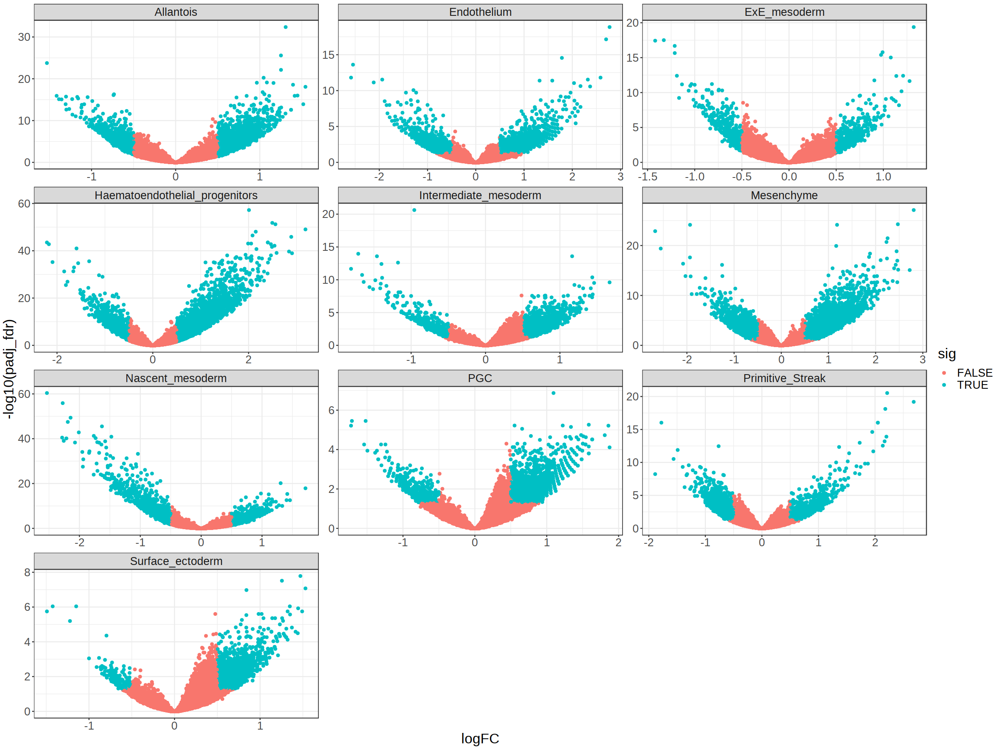

In [31]:
options(repr.plot.width=20, repr.plot.height=15) 

ggplot(DARs[!is.na(logFC)], aes(logFC, -log10(padj_fdr), col=ifelse(abs(logFC)>0.5 & padj_fdr<0.05, TRUE, FALSE))) + 
    geom_point() + 
    facet_wrap(~celltype, nrow=4, scales='free') + 
    scale_color_discrete(name='sig') + 
    theme_bw() + theme(text=element_text(size=20, color='black'))

In [ ]:
plot_DEGs = function(ct, nlabels=10){
    DEG_tmp = DARs[celltype==ct & logFC!=0,] %>%
        .[, sig:=ifelse(abs(logFC)>1 & padj_fdr<0.05, TRUE, FALSE)]

    if(nrow(DEG_tmp)>1){
    labels_up = DEG_tmp[sig==TRUE & logFC>0,] %>% .[order(-logFC),] %>% head(nlabels)
    labels_down = DEG_tmp[sig==TRUE & logFC<0,] %>% .[order(logFC),] %>% head(nlabels)
    labels = rbind(labels_up, labels_down)
    
    xlim = max(abs(DEG_tmp$logFC))
    
    text = data.frame(dir=c('Up', 'Down'), 
                  feature=c(nrow(DEG_tmp[sig==TRUE & logFC>0,]), 
                          nrow(DEG_tmp[sig==TRUE & logFC<0,])),
                  logFC = c(xlim, -xlim), 
                  padj_fdr = min(DEG_tmp$padj_fdr),
                     sig=c('FALSE', 'FALSE'))
    
    DEG_plot = ggplot(DEG_tmp, aes(logFC, -log10(padj_fdr), col=sig, label=feature)) + 
        geom_point() + 
        geom_text(data=text, aes(logFC, -log10(padj_fdr), label=feature), size=8) + 
        xlim(-xlim, xlim) + 
        scale_color_manual(values=c('TRUE'='red', 'FALSE'='black')) + 
        geom_vline(xintercept = 0, col='red', linetype='dotted') +
        ggrepel::geom_text_repel(data=labels, 
                                 col='black', 
                                 max.overlaps=Inf,
                                 box.padding = 0.5) + 
        ggtitle(paste0(ct, ' - ', nrow(DEG_tmp), ' peaks')) +
        theme_bw() + 
        theme(#text=element_text(size=15),
             legend.position='none')
    return(DEG_plot)

    }
}


In [ ]:
celltypes_keep = unique(DARs[!is.na(feature),celltype])

In [ ]:
DEG_plots = lapply(args$celltypes, plot_DEGs, nlabels=0)
names(DEG_plots) = args$celltypes

DEG_plots_filt = list()

for(i in celltypes_keep){
DEG_plots_filt[[i]] = DEG_plots[[i]]
}

In [ ]:
options(repr.plot.width=20, repr.plot.height=15) 
ggarrange(plotlist=DEG_plots_filt)

In [ ]:
head(features)

In [33]:
peak_nearby_gene = as.data.table(ArchRProject@peakSet) %>% 
    .[,feature:=paste0(seqnames, ':', start,'-', end)] %>%
    .[,c('feature', 'distToGeneStart', 'nearestGene', 'peakType')]

In [ ]:
hea

In [34]:
test = DARs %>% 
    .[abs(logFC)>1] %>%
    .[, diff:=ifelse(logFC>1 & padj_fdr<0.05, 'up', 
                    ifelse(logFC<1 & padj_fdr<0.05, 'down', NA))] %>%
    .[!is.na(diff),]

In [52]:
up = merge(test[diff=='up',c('feature', 'celltype')], peak_nearby_gene, by='feature')

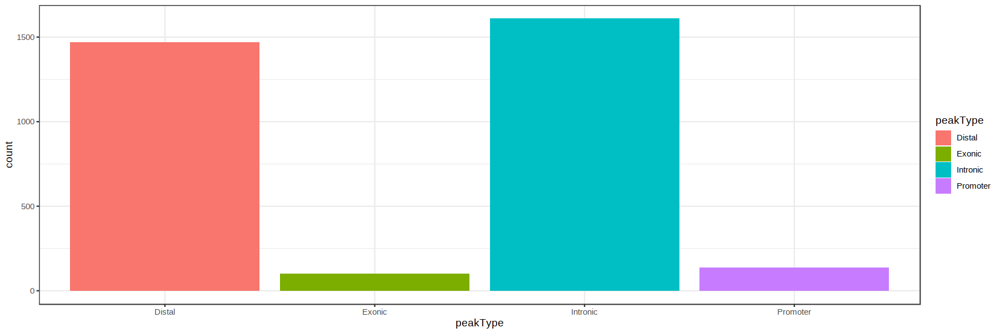

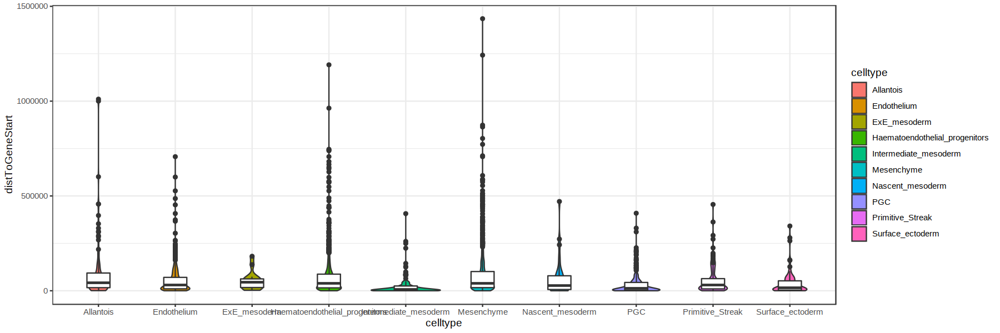

In [36]:
options(repr.plot.width=15, repr.plot.height=5) 
ggplot(up, aes(peakType, fill=peakType)) + geom_bar() + theme_bw()
ggplot(up, aes(celltype, distToGeneStart, fill=celltype)) + geom_violin() + geom_boxplot(fill='white', width=0.3) + theme_bw()

In [37]:
up_genes = up %>% .[, c('feature', 'celltype'):=list(NULL,NULL)] %>% .[,N:=.N, by='nearestGene'] %>% unique(by='nearestGene') %>% .[order(-N)]
head(up_genes,10)

distToGeneStart,nearestGene,peakType,N
<int>,<chr>,<chr>,<int>
246555,Wnt5a,Intronic,7
27467,Usp6nl,Intronic,6
626763,Adgrl2,Distal,6
301815,Mecom,Intronic,6
2559,D6Ertd527e,Distal,6
501476,Foxp1,Intronic,6
173787,2310008N11Rik,Distal,6
103570,Fut8,Distal,5
1618,4833427F10Rik,Promoter,5


In [55]:
up[celltype=='Nascent_mesoderm', nearestGene]

[1] "Nt5dc3"        "Gm12159"       "Irf9"          "Ints9"        
 [5] "Pdzd2"         "Tprg"          "Nr1i2"         "Bak1"         
 [9] "Ly6g6e"        "Mocs1"         "4930405O22Rik" "Wdr7"         
[13] "Uhrf2"         "Aip"           "Prg4"          "Slamf6"       
[17] "Nck2"          "Sall4"         "Etl4"          "Ttc30a1"      
[21] "Il6ra"         "Atp13a2"       "Ttc28"         "Kit"          
[25] "Hoxa5"         "Mitf"          "1700123J17Rik" "Disc1"        
[29] "Uba7"          "2900052N01Rik" "Lrrc49"        "Cgnl1"        
[33] "Minar1"        "Tfdp2"

In [38]:
down = merge(test[diff=='down',c('feature', 'celltype')], peak_nearby_gene, by='feature')

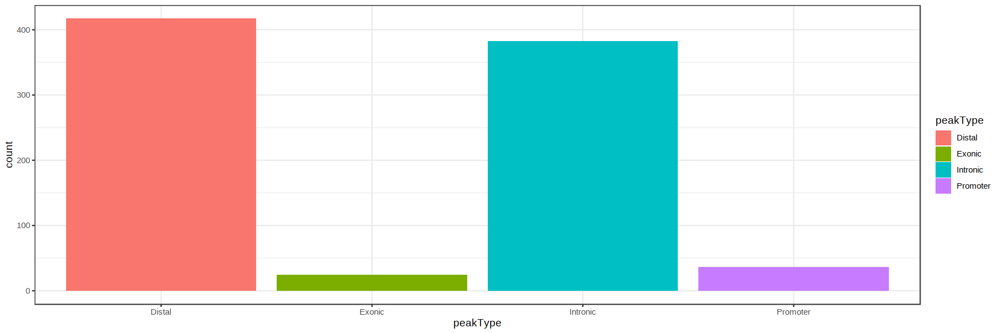

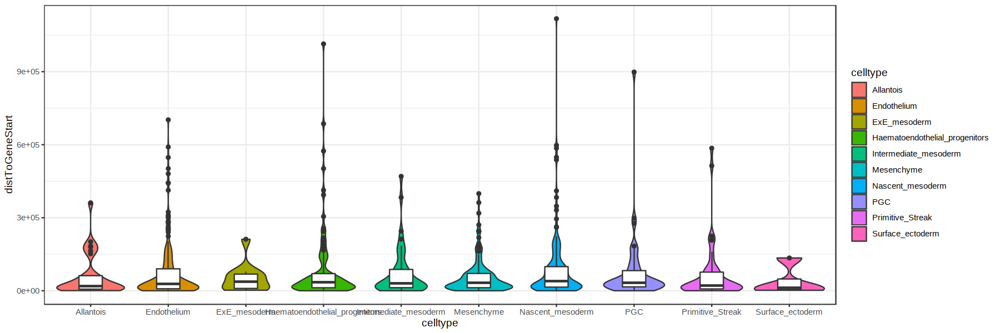

In [39]:
options(repr.plot.width=15, repr.plot.height=5) 
ggplot(down, aes(peakType, fill=peakType)) + geom_bar() + theme_bw()
ggplot(down, aes(celltype, distToGeneStart, fill=celltype)) + geom_violin() + geom_boxplot(fill='white', width=0.3) + theme_bw()

In [40]:
down = merge(test[diff=='down',c('feature', 'celltype')], peak_nearby_gene, by='feature')

In [41]:
# genes that have any downregulated feature, counted by how many celltype.
down_genes = down %>% unique(by=c('celltype', 'nearestGene')) %>% .[, c('feature', 'celltype'):=list(NULL,NULL)] %>% .[,N:=.N, by='nearestGene'] %>% unique(by='nearestGene') %>% .[order(-N)]

In [42]:
head(down_genes)

distToGeneStart,nearestGene,peakType,N
<int>,<chr>,<chr>,<int>
2294,Rubie,Intronic,5
69221,Acsl3,Distal,5
17904,N4bp2,Distal,5
86933,Zcchc2,Distal,4
36553,Ackr3,Distal,4
179631,Samd5,Distal,3


In [ ]:
down_genes$nearestGene

[1] "Rubie"         "Acsl3"         "N4bp2"         "Zcchc2"       
  [5] "Ackr3"         "Samd5"         "Lgals3bp"      "2610027K06Rik"
  [9] "Atxn7l1"       "Nova1"         "Dlg5"          "Hunk"         
 [13] "Runx1"         "Fndc1"         "Zfp516"        "4930528P14Rik"
 [17] "Olfm1"         "Mybphl"        "Il12a"         "Cdk5rap2"     
 [21] "5430421F17Rik" "Hmgcll1"       "Kitl"          "4921513I03Rik"
 [25] "Map3k5"        "Gm17455"       "Ank3"          "Itgb2"        
 [29] "Dnah17"        "Tmem17"        "Phykpl"        "Gm15326"      
 [33] "Ofcc1"         "Spock1"        "Cebpe"         "Zfp395"       
 [37] "Gm10845"       "Eif3h"         "Srebf2"        "Ttll12"       
 [41] "Adcy5"         "Cd200r3"       "Pi16"          "Plcl2"        
 [45] "St6gal2"       "Mir5709"       "Ezr"           "Pde10a"       
 [49] "6530411M01Rik" "Ino80c"        "Ldlrad4"       "Cyp26a1"      
 [53] "Serpinb8"      "Cxcr4"         "Stx6"          "Rabgap1l"     
 [57] "Prox1"         "Aff3"          "Lonrf2"        "Igfbp2"       
 [61] "Twist2"        "Mir669h"       "Dsn1"          "Cdh26"        
 [65] "9030204H09Rik" "Ttll11"        "Ccdc141"       "Ccnl1"        
 [69] "Ube2u"         "Slc1a7"        "Crybg2"        "Mir6403"      
 [73] "Map3k7"        "Ptpn13"        "Slc26a5"       "Cdk6"         
 [77] "Fosl2"         "Mrfap1"        "Stx18"         "Slc2a9"       
 [81] "Chrna9"        "Gm6116"        "Kit"           "Kdr"          
 [85] "Fbln2"         "Sbf2"          "A730082K24Rik" "Vwa3a"        
 [89] "Cacng3"        "Fgfr2"         "Tmem86b"       "Mex3b"        
 [93] "Irs2"          "Col4a1"        "Fam92b"        "Gse1"         
 [97] "Gm8179"        "Mir138-1"      "Bmper"         "Herpud2"      
[101] "Nectin1"       "Rplp1"         "Yap1"          "Bcor"         
[105] "Csrp2"         "4933440J02Rik" "Glipr1l1"      "Epm2a"        
[109] "Kcnmb4os1"     "Frs2"          "Hmga2"         "Utrn"         
[113] "Cited2"        "Slc35d3"       "Map7"          "Rpl32l"       
[117] "Themis"        "Hs3st5"        "Gpr6"          "F930017D23Rik"
[121] "Prep"          "Sh3rf3"        "Mcu"           "Slc29a3"      
[125] "Pald1"         "Rtkn2"         "D630013N20Rik" "Gnaz"         
[129] "Tspear"        "Ap3d1"         "Nuak1"         "1700113H08Rik"
[133] "Sash1"         "Metap2"        "Eea1"          "Rab5c"        
[137] "Cdc42ep4"      "Socs3"         "Rbfox3"        "Uts2r"        
[141] "Egfr"          "4931440F15Rik" "Sptbn1"        "Dock2"        
[145] "Mir218-2"      "Lif"           "Sgcd"          "Adamts2"      
[149] "Jade2"         "Shroom1"       "Acsl6"         "Glra1"        
[153] "Prpsap2"       "Pigl"          "Pmp22"         "Hs3st3a1"     
[157] "Myo1g"         "Gm12295"       "Bcl6b"         "Vmo1"         
[161] "Ggt6"          "Rpa1"          "Crk"           "Mrm3"         
[165] "1700109G15Rik" "Tbx4"          "Cltc"          "Sun3"         
[169] "Tom1l1"        "Dlx3"          "D030028A08Rik" "Gm10432"      
[173] "Ak7"           "4933406K04Rik" "4930465M20Rik" "Evl"          
[177] "Mir3072"       "Ppp2r5c"       "Adam6b"        "Mycn"         
[181] "Ntsr2"         "Odc1"          "Hpcal1"        "Cmpk2"        
[185] "Sox11"         "Eipr1"         "Myt1l"         "Agr3"         
[189] "Dnmt3aos"      "Egln3"         "Fancm"         "Daam1"        
[193] "AI463170"      "Max"           "Rad51b"        "Susd6"        
[197] "Slc8a3"        "1700085C21Rik" "Syndig1l"      "Ism2"         
[201] "Mast4"         "Nln"           "AI197445"      "1700006H21Rik"
[205] "Ankrd55"       "Amph"          "Olfr263"       "Gpx5"         
[209] "Carmil1"       "Gm11346"       "Prl"           "Foxf2"        
[213] "Foxc1"         "Psmg4"         "Nrn1"          "Slc35b3"      
[217] "Jarid2"        "Secisbp2"      "9530014B07Rik" "Smad5"        
[221] "Tut7"          "Ptch1"         "Pfkp"          "Ube2ql1"      
[225] "Gm20554"       "Arrdc3"        "Tmem161b"      "Wdr37"        
[229] "A6300

In [ ]:
plot_GO = function(gene_list, top_n=100, nlabels=10){
    targets = head(gene_list[N>1], top_n)$nearestGene
    up_entrez = mapIds(org.Mm.eg.db, targets, 'ENTREZID', 'SYMBOL')
    up_GO = as.data.table(goana(up_entrez, species="Mm"), 
                          keep.rownames=T)[order(P.DE),] %>% .[,head(.SD,10), by='Ont'] %>%
        .[,Term:=factor(Term, levels=Term)]
    
    GO_terms.plot = up_GO
    GO_terms.plot$Term = make.names(GO_terms.plot$Term, unique=TRUE)
    GO_terms.plot = GO_terms.plot[order(-P.DE),][,Term:=factor(Term, levels=Term)]
    
    GO_plot = ggplot(GO_terms.plot, aes(Term, -log10(P.DE), fill=Ont)) +
        geom_bar(stat='identity', col='black') + 
        geom_point(y=0, size=8) +
        coord_flip() + 
        geom_text(label=GO_terms.plot$DE, aes(y=0), col='white', fontface='bold', size=5) + 
        ggtitle('') +
        theme_bw() + 
        facet_wrap(~Ont, scales='free', ncol=1) + 
        theme(text=element_text(size=15),
             legend.position='none',
             axis.title.y=element_blank(),
             axis.text.y=element_text(color='black'),
             axis.title.x=element_blank(),
             strip.background = element_rect(fill='white'))
    return(GO_plot)
    }

In [ ]:
options(repr.plot.width=15, repr.plot.height=10) 
ggarrange(plot_GO(up_genes, 100), plot_GO(down_genes, 100))

In [ ]:
down_genes = down_genes %>% .[,nearestGene:=factor(nearestGene, levels=nearestGene)]

In [ ]:
test.mtx = atac.se['chr2:157957657-157958257']@assays@data$logcounts

In [ ]:
rownames(test.mtx) = 'feature'

In [ ]:
test = merge(t(test.mtx), colData(atac.se), by=0)

In [ ]:
test = as.data.table(test) %>% .[, c('mean', 'sd'):=list(mean(feature), sd(feature)), by='celltype_genotype'] %>% unique(by='celltype_genotype')

In [ ]:
celltypes = c('Epiblast', 'Primitive_Streak', 'Mixed_mesoderm', 'ExE_mesoderm', 'Haematoendothelial_progenitors', 'Allantois', 'Endothelium', 'Blood_progenitors_1', 'Blood_progenitors_2', 'Erythroid1')
test2 = test[celltype %in% celltypes] %>% .[,celltype:=factor(celltype, levels=celltypes)]

In [ ]:
ggplot(test2, aes(celltype, mean, col=genotype, group=genotype)) + 
    geom_point() + 
    geom_errorbar(aes(ymin=mean-sd, ymax=mean+sd), width=.2) +  
    geom_line()+ 
    theme_bw()

In [ ]:
DAR.counts = DARs %>% 
    .[abs(logFC)>1] %>%
    .[, diff:=ifelse(logFC>=1 & padj_fdr<0.05, 'up', 
                    ifelse(logFC<=1 & padj_fdr<0.05, 'down', NA))] %>%
    .[!is.na(diff),] %>%
    .[, N:=.N, by=c('celltype', 'diff')] %>% unique(by=c('celltype', 'diff')) %>% .[,c('celltype', 'diff', 'N')]

In [ ]:
options(repr.plot.width=15, repr.plot.height=5) 
ggplot(DAR.counts, aes(celltype, N, fill=diff)) + 
    geom_bar(stat= 'identity', position='dodge') +
    theme_bw() +
    theme(text=element_text(size=15),
         axis.text.x=element_text(angle=-15, hjust=0, vjust=1))

In [ ]:
head(DAR.counts)

# Heatmap

In [64]:
heatmap.features = DARs %>% 
    .[abs(logFC)>1.5] %>%
    .[, diff:=ifelse(logFC>=1 & padj_fdr<0.05, 'up', 
                    ifelse(logFC<=1 & padj_fdr<0.05, 'down', NA))] %>%
    .[!is.na(diff),]

In [65]:
atac.se.heatmap = atac.se[heatmap.features$feature]

In [67]:
means = lapply(unique(colData(atac.se.heatmap)$celltype_genotype), function(ct_gt){
    tmp = atac.se.heatmap[,colData(atac.se.heatmap)$celltype_genotype == ct_gt]
    mean = as.matrix(rowMeans(logcounts(tmp)))
    colnames(mean) = ct_gt
    return(mean)
    })

In [68]:
means.mtx = do.call('cbind', means)

In [69]:
library(ComplexHeatmap)

In [70]:
meta = as.data.table(colData(atac.se.heatmap)) %>% unique(by='celltype_genotype')

In [71]:
head(meta)

celltype,genotype,celltype_genotype
<chr>,<chr>,<chr>
Allantois,eomes_ko,Allantois_eomes_ko
Allantois,wt,Allantois_wt
Anterior_Primitive_Streak,eomes_ko,Anterior_Primitive_Streak_eomes_ko
Anterior_Primitive_Streak,wt,Anterior_Primitive_Streak_wt
Blood_progenitors_1,wt,Blood_progenitors_1_wt
Blood_progenitors_2,wt,Blood_progenitors_2_wt


In [72]:
opts$celltype.color

Epiblast               Primitive_Streak 
                     "#635547"                      "#DABE99" 
               Caudal_epiblast                            PGC 
                     "#9e6762"                      "#FACB12" 
     Anterior_Primitive_Streak                      Notochord 
                     "#c19f70"                      "#0F4A9C" 
                 Def._endoderm                            Gut 
                     "#F397C0"                      "#EF5A9D" 
              Nascent_mesoderm                 Mixed_mesoderm 
                     "#C594BF"                      "#DFCDE4" 
         Intermediate_mesoderm                Caudal_Mesoderm 
                     "#139992"                      "#3F84AA" 
             Paraxial_mesoderm               Somitic_mesoderm 
                     "#8DB5CE"                      "#005579" 
           Pharyngeal_mesoderm                 Cardiomyocytes 
                     "#C9EBFB"                      "#B51D8D" 
                     Allantois                   ExE_mesoderm 
                     "#532C8A"                      "#8870ad" 
                    Mesenchyme Haematoendothelial_progenitors 
                     "#cc7818"                      "#FBBE92" 
                   Endothelium              Blood_progenitors 
                     "#ff891c"                      "#c9a997" 
           Blood_progenitors_1            Blood_progenitors_2 
                     "#f9decf"                      "#c9a997" 
                     Erythroid                     Erythroid1 
                     "#EF4E22"                      "#C72228" 
                    Erythroid2                     Erythroid3 
                     "#f79083"                      "#EF4E22" 
                           NMP                   Neurectoderm 
                     "#8EC792"                      "#65A83E" 
          Rostral_neurectoderm            Caudal_neurectoderm 
                     "#65A83E"                      "#354E23" 
                  Neural_crest   Forebrain_Midbrain_Hindbrain 
                     "#C3C388"                      "#647a4f" 
                   Spinal_cord               Surface_ectoderm 
                     "#CDE088"                      "#f7f79e" 
             Visceral_endoderm                   ExE_endoderm 
                     "#F6BFCB"                      "#7F6874" 
                  ExE_ectoderm              Parietal_endoderm 
                     "#989898"                      "#1A1A1A"

In [59]:
#top annotation
anno <- HeatmapAnnotation(df=meta[,c('celltype', 'genotype')], 
                          col = list(genotype=c("wt"="#00afbb", "eomes_ko"="#fc4e07"), 
                                     celltype=opts$celltype.color),
                          annotation_legend_param = list(title_gp = gpar(fontsize = 12),
                                                         labels_gp = gpar(fontsize = 12)))

In [74]:
means.mtx <- t(scale(t(means.mtx)))

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.



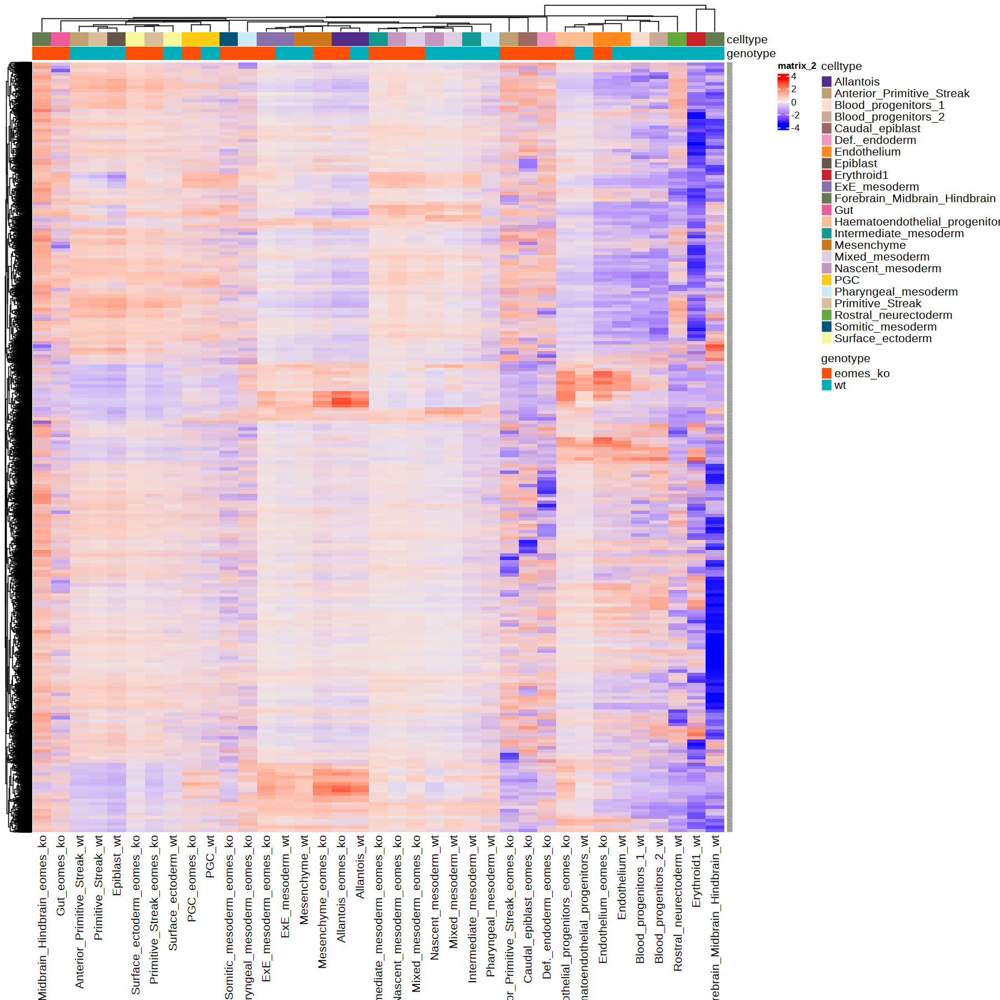

In [75]:
options(repr.plot.width=15, repr.plot.height=15) 

Heatmap(means.mtx, 
        top_annotation = anno,
        cluster_columns = T,
        row_names_gp = gpar(fontsize = 0))

# Up & Down motifs

### Idea

make these types of graphs but instead of indicates motifs up in a celltype, indicate motifs up in Eomes-KO in that celltype, same for downregulated 

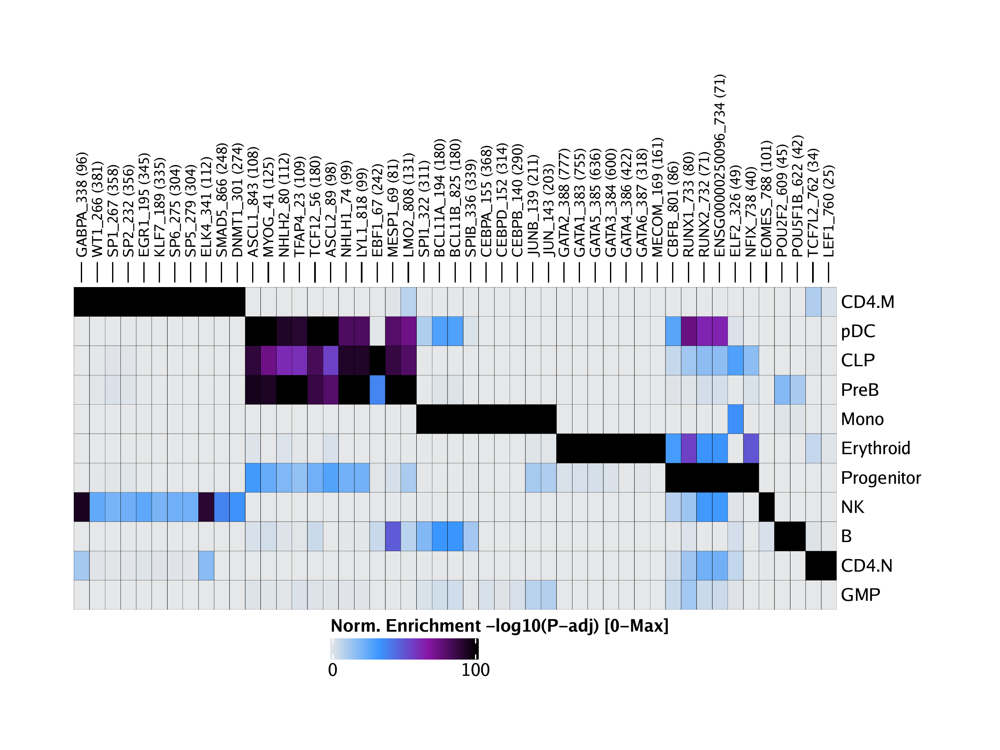


In [9]:
DARs = fread(file.path(io$basedir, 'results/atac/archR/differential/DARs.txt.gz'))

In [10]:
matches = readRDS('/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/Annotations/peakAnnotation.rds')

In [11]:
ArchRProject@peakAnnotation = matches

ERROR: Error in ArchRProject@peakAnnotation = matches: object 'ArchRProject' not found


In [ ]:
ct = 'Allantois'
markers = getMarkerFeatures(
          ArchRProj = ArchRProject, 
          useMatrix = "PeakMatrix",
          groupBy = "celltype_genotype",
          testMethod = "binomial",
          binarize=TRUE,
          bias = c("TSSEnrichment", "log10(nFrags)"),
          useGroups = paste0(ct, '-eomes_ko'),
          bgdGroups = paste0(ct, '-wt'),
          verbose= FALSE)

In [ ]:
peakset = as.data.table(ArchRProject@peakSet) %>% 
    .[, feature:=paste0(seqnames, ':', start, '-', end)] %>%
    .[,idx:=1:nrow(.)] %>%
    .[,c('feature', 'idx')]

In [ ]:
ct_keep = c( 'Primitive_Streak', 'Nascent_mesoderm', 'Mixed_mesoderm', 'ExE_mesoderm', 'Haematoendothelial_progenitors',  'Allantois','Endothelium','Intermediate_mesoderm',  'Mesenchyme')
DARs = DARs[celltype %in% ct_keep]

In [ ]:
enrich_full = list()
for(i in unique(DARs$celltype)){
        tmp1 = merge(data.table(idx=1:nrow(peakset)), DARs[celltype==i], by='idx', all.x=T) %>%
                        .[,c('Log2FC', 'FDR'):=list(ifelse(is.na(logFC), 0, logFC),
                                                    ifelse(is.na(padj_fdr), 1, padj_fdr))]
    tmp2 = markers
    tmp2@assays@data$Log2FC = data.frame('x'=tmp1$Log2FC)
    tmp2@assays@data$FDR = data.frame('x'=tmp1$FDR)
    colnames(tmp2) = i
    enrich_full[[i]] = tmp2
}
enrich_full = do.call('cbind', enrich_full)

In [ ]:
addArchRVerbose(verbose = FALSE)

Adding Annotations..

Preparing Main Heatmap..



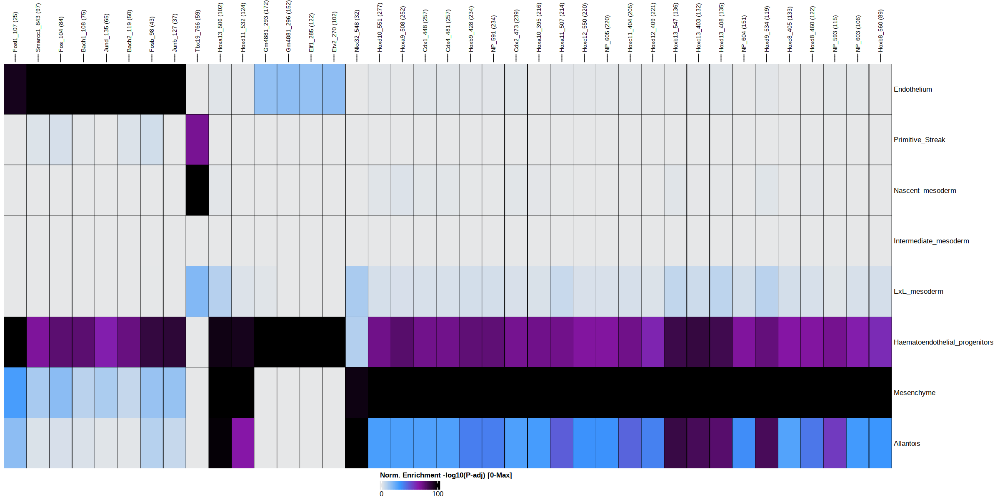

In [148]:
enrichMotifs <- peakAnnoEnrichment(
    seMarker = enrich_full,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_cisbp",
    cutOff = "FDR <= 0.05 & Log2FC >= 0.5"
  )
heatmapEM <- plotEnrichHeatmap(enrichMotifs, n = 25, transpose = TRUE)
options(repr.plot.width=20, repr.plot.height=10)
ComplexHeatmap::draw(heatmapEM, heatmap_legend_side = "bot", annotation_legend_side = "bot")

In [149]:
#enriched = as.data.table(do.call('cbind', enrichMotifs@assays@data$), keep.rownames=T) %>% setnames('rn', 'TF')

In [165]:
plot_enr_heatmap = function(enrichMotifs, ntop=25) {
    heatmapEM <- plotEnrichHeatmap(enrichMotifs, n = ntop, returnMatrix = TRUE)

    enriched.dt = melt(as.data.table(heatmapEM, keep.rownames=T) %>% setnames('rn', 'TF'), id.vars = c("TF")) %>%
        .[order(-value)] 
    keep_tfs = enriched.dt[, head(.SD, ntop),  by=variable]$TF
    enriched.dt = enriched.dt[TF %in% keep_tfs] %>% .[order( -value)] %>% 
        .[,TF:=strsplit(TF, '_') %>% map_chr(1)] %>%
         .[,TF:=factor(TF, levels=unique(TF))] %>%
        .[,variable:=factor(variable, levels=ct_keep)]
    
    p = ggplot(enriched.dt, aes(TF, variable, fill=value)) + 
    geom_tile(col='black') + 
    viridis::scale_fill_viridis(name='Norm. Enrichment -log10(P-adj) [0-max]') + 
    theme_void() + theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5), 
                         axis.text.y=element_text(hjust=1),
                        legend.position='bottom')
    return(p)
}

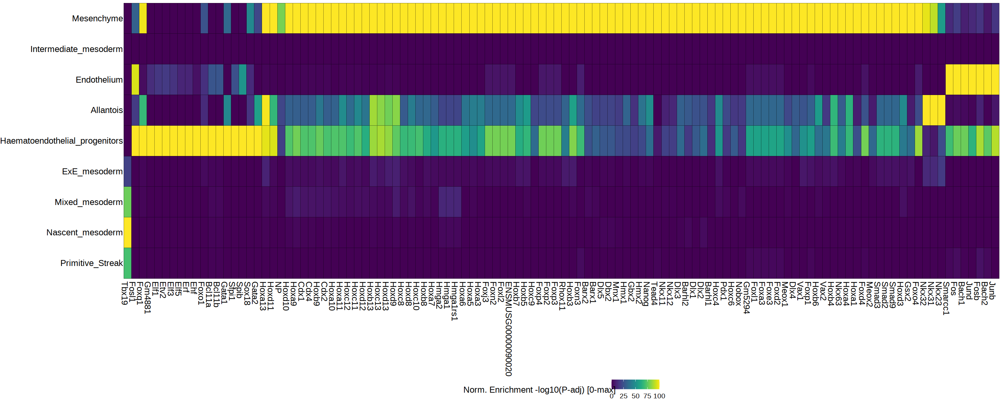

In [160]:
enrichMotifs <- peakAnnoEnrichment(
    seMarker = enrich_full,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_cisbp",
    cutOff = "FDR <= 0.05 & Log2FC >= 0.5"
  )
options(repr.plot.width=25, repr.plot.height=10)

plot_enr_heatmap(enrichMotifs, ntop = 100)

In [166]:
enrichMotifs <- peakAnnoEnrichment(
    seMarker = enrich_full,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_JASPAR2020",
    cutOff = "FDR <= 0.05 & Log2FC >= 0.5"
  )
options(repr.plot.width=25, repr.plot.height=10)

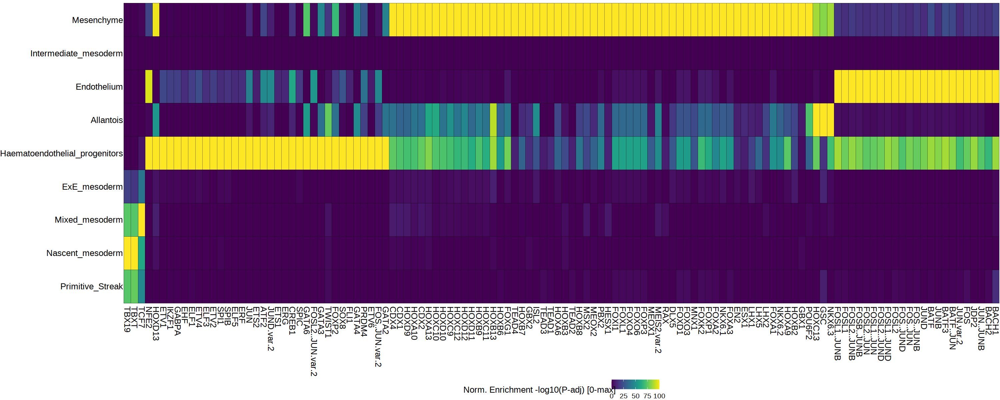

In [167]:
plot_enr_heatmap(enrichMotifs, ntop = 80)

In [168]:
pdf(sprintf('%s/results/atac/archR/differential/motif_up_celltype_jaspar.pdf', io$basedir), width=23, height=6)
     plot_enr_heatmap(enrichMotifs, ntop = 80)
dev.off()

png 
  2

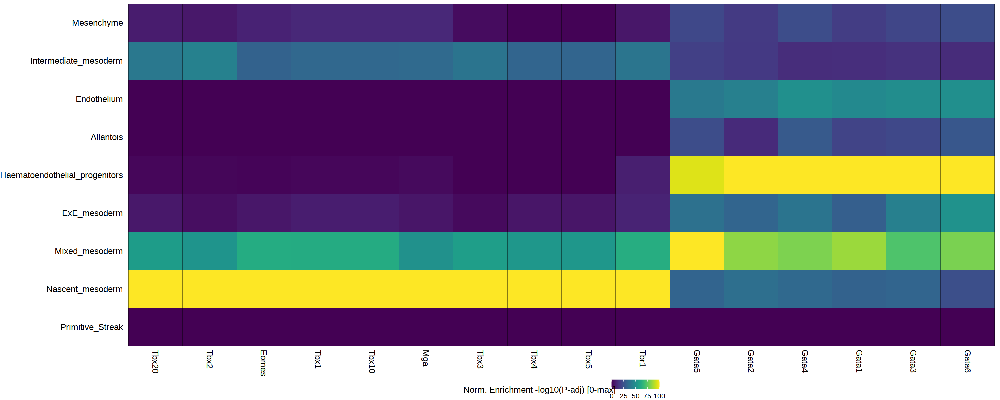

In [169]:
enrichMotifs <- peakAnnoEnrichment(
    seMarker = enrich_full,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_cisbp",
    cutOff = "FDR <= 0.05 & Log2FC <= -0.5"
  )

plot_enr_heatmap(enrichMotifs, ntop = 50)

In [ ]:
enrichMotifs <- peakAnnoEnrichment(
    seMarker = enrich_full,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_JASPAR2020",
    cutOff = "FDR <= 0.05 & Log2FC <= -0.5"
  )

plot_enr_heatmap(enrichMotifs, ntop = 50)

pdf(sprintf('%s/results/atac/archR/differential/motif_down_celltype_jaspar.pdf', io$basedir), width=10, height=6)
     plot_enr_heatmap(enrichMotifs, ntop = 100)
dev.off()

png 
  2

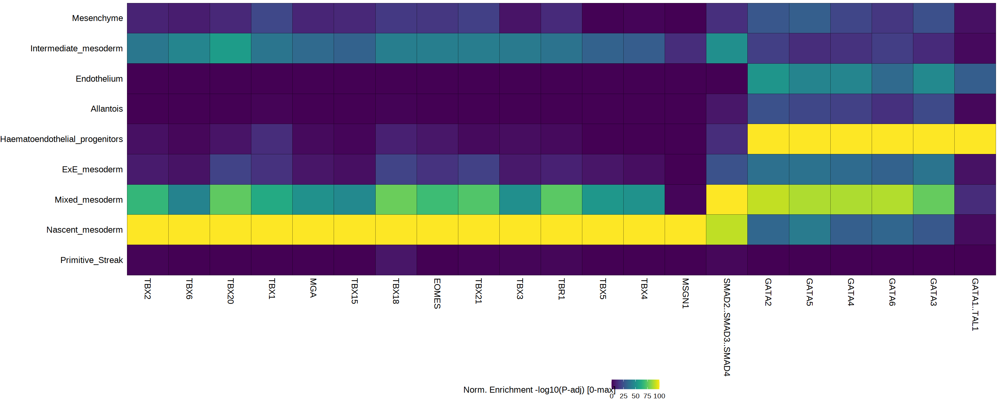

In [170]:
# Accidentally had cutoffs wrong initially!!!! dumb dumb dumb
enrichMotifs <- peakAnnoEnrichment(
    seMarker = enrich_full,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_JASPAR2020",
    cutOff = "FDR <= 0.5 & Log2FC <= -0.5"
  )

plot_enr_heatmap(enrichMotifs, ntop = 50)

pdf(sprintf('%s/results/atac/archR/differential/motif_down_celltype_jaspar.pdf', io$basedir), width=10, height=6)
     plot_enr_heatmap(enrichMotifs, ntop = 100)
dev.off()

# Inspecting motif dynamics

In [79]:
matrix = readRDS(file.path(io$basedir, 'results/atac/archR/pseudobulk/celltype_genotype/PeakMatrix/pseudobulk_PeakMatrix_summarized_experiment.rds'))

In [258]:
DARs = fread(file.path(io$basedir, 'results/atac/archR/differential/DARs.txt.gz'))

In [85]:
Matches = readRDS('/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/Annotations/Motif_cisbp-Matches-In-Peaks.rds')

In [184]:
Eomes_regions = Matches[,grep('Eomes', colnames(Matches))]

In [185]:
rowData(Eomes_regions)$idx = 1:length(Eomes_regions)

In [186]:
regions = Eomes_regions[!as.vector(Eomes_regions@assays@data$matches==0)]

In [187]:
eomes_matrix = matrix[rowData(regions)$idx,]

In [188]:
eomes_matrix.mean = data.table(celltype = strsplit(colnames(eomes_matrix), "-") %>% map_chr(1), 
                               genotype = strsplit(colnames(eomes_matrix), "-") %>% map_chr(2), 
                               mean = colMeans(eomes_matrix@assays@data$PeakMatrix))

In [189]:
head(eomes_matrix@assays@data$PeakMatrix)

,Allantois-eomes_ko,Allantois-wt,Anterior_Primitive_Streak-eomes_ko,Anterior_Primitive_Streak-wt,Blood_progenitors_1-wt,Blood_progenitors_2-wt,Caudal_epiblast-eomes_ko,Caudal_epiblast-wt,Caudal_Mesoderm-eomes_ko,Caudal_Mesoderm-wt,⋯,Pharyngeal_mesoderm-wt,Primitive_Streak-eomes_ko,Primitive_Streak-wt,Rostral_neurectoderm-eomes_ko,Rostral_neurectoderm-wt,Somitic_mesoderm-eomes_ko,Somitic_mesoderm-wt,Surface_ectoderm-eomes_ko,Surface_ectoderm-wt,Visceral_endoderm-wt
f2,933,239,18,80,5,4,3,0,0,0,⋯,100,87,553,2,4,27,0,149,74,0
f3,145,28,10,99,0,3,4,2,0,0,⋯,4,78,630,6,8,27,2,67,60,0
f13,121,40,6,60,2,6,5,2,0,0,⋯,11,77,497,4,13,6,2,74,39,0
f27,1052,216,0,29,14,12,0,3,0,0,⋯,33,58,326,4,10,15,0,86,33,0
f31,1613,263,5,90,2,2,2,2,0,0,⋯,39,30,351,4,0,37,4,84,72,0
f42,1024,218,13,169,20,8,9,0,0,0,⋯,53,152,1409,6,27,35,0,189,108,0


In [190]:
eomes_matrix.mean = eomes_matrix.mean %>% 
    .[celltype %in% ct_keep] %>% .[,celltype:=factor(celltype, levels=ct_keep)]

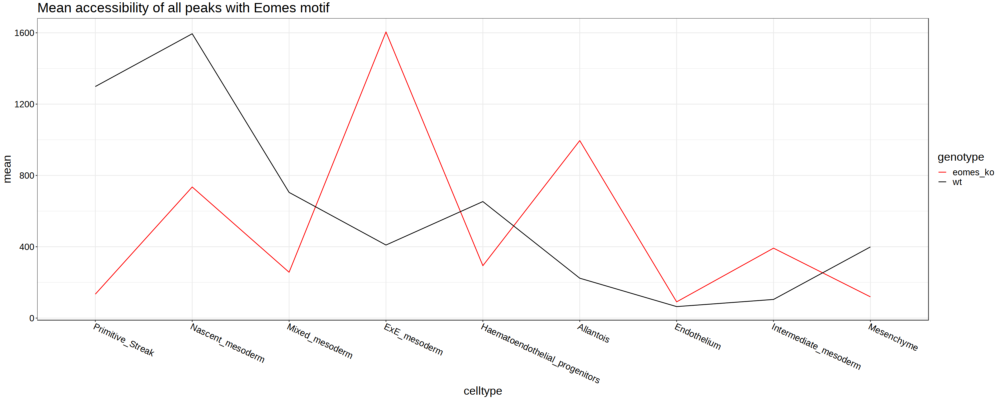

In [218]:
options(repr.plot.width=25, repr.plot.height=10)
ggplot(eomes_matrix.mean, aes(celltype, mean, col=genotype, group=genotype)) + 
    geom_line() + 
    scale_color_manual(values=c('eomes_ko'='red', 'wt'='black')) + 
    ggtitle('Mean accessibility of all peaks with Eomes motif') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-25, hjust=0, vjust=1),
         text=element_text(size=20, color='black'),
         axis.text=element_text(color='black') )

In [199]:
expr = readRDS(file.path(io$basedir, '/results/rna/pseudobulk/celltype_genotype/SingleCellExperiment_pseudobulk.rds'))

In [203]:
toMatch = c('Tbx','Eomes')
matches <- unique(grep(paste(toMatch,collapse="|"), 
                        rownames(expr), value=TRUE))

In [211]:
expr = expr[,grep(paste(ct_keep,collapse="|"), 
                        colnames(expr))]

In [213]:
expr_tbox = logcounts(expr[matches,])

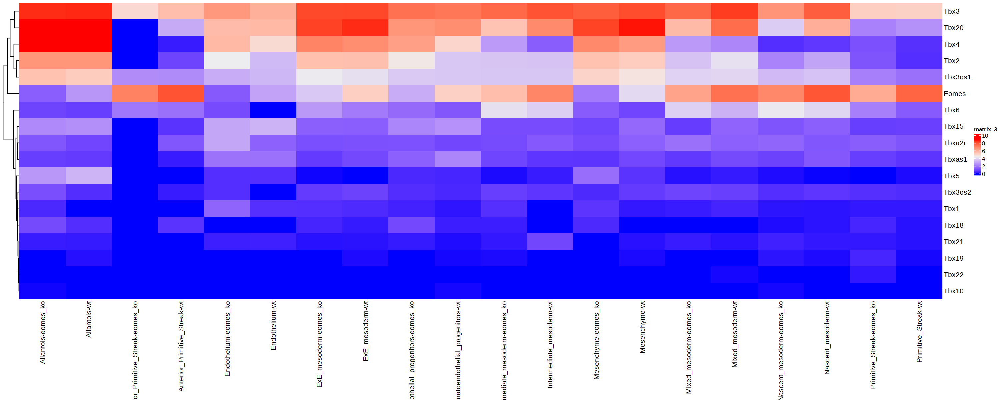

In [216]:
Heatmap(expr_tbox,
       cluster_columns=FALSE)

In [234]:
peakset = as.data.table(ArchRProject@peakSet) %>% .[,idx:=1:nrow(.)] %>%
    .[,feature:=paste0(seqnames, ':',start, '-', end)]

In [311]:
DAR_PS = DARs[celltype=='Primitive_Streak']

In [312]:
nrow(DAR_PS)

[1] 46176

In [319]:
DAR_PS = DAR_PS %>% 
    .[,sig:=ifelse(abs(logFC)>0.5 & padj_fdr<0.05, TRUE, FALSE)] %>% 
    .[sig==TRUE]

In [330]:
DAR_PS_eomes = DAR_PS[idx %in% rowData(regions)$idx]

In [331]:
nrow(DAR_PS_eomes)

[1] 230

In [323]:
peak_nearby_gene = as.data.table(ArchRProject@peakSet) %>% 
    .[,feature:=paste0(seqnames, ':', start,'-', end)] %>%
    .[,c('feature', 'distToGeneStart', 'nearestGene', 'peakType')]

In [332]:
DAR_PS_eomes = merge(DAR_PS_eomes, peak_nearby_gene, by='feature') %>% .[distToGeneStart<=150000]

In [334]:
unique(DAR_PS_eomes[logFC>0]$nearestGene)

[1] "Glipr1l2"      "Stx7"          "Ttyh2"         "H3f3b"        
 [5] "Smim23"        "Mgat1"         "Adora2b"       "Myh10"        
 [9] "Lhx1os"        "Mark3"         "9530020I12Rik" "Gm17746"      
[13] "Sipa1l1"       "Sntn"          "Anxa7"         "Extl3"        
[17] "Trib1"         "Pacsin2"       "1810021B22Rik" "Abca17"       
[21] "Anks1"         "1810013A23Rik" "Ptprm"         "Hnrnpll"      
[25] "Greb1l"        "AW554918"      "Flrt1"         "C4bp"         
[29] "Slc41a1"       "Btg2"          "Tdrd5"         "Nhlh1"        
[33] "Gm5069"        "Tlr5"          "Mir375"        "St8sia4"      
[37] "4930598F16Rik" "Jph2"          "Ccdc187"       "Fam163b"      
[41] "Agps"          "Itgav"         "Lef1"          "Acot11"       
[45] "Mir7021"       "Clstn1"        "Arhgef16"      "Samd11"       
[49] "Oasl2"         "Tmem116"       "Mafk"          "Mad1l1"       
[53] "Stard13"       "Tada2b"        "Klf3"          "9130230L23Rik"
[57] "Clec5a"        "Trh"           "5430419D17Rik" "Irf7"         
[61] "Zfp14"         "Kcna7"         "Mir7056"       "Nek1"         
[65] "Ifrd2"         "Acaa1a"        "Epor"          "Ets1"         
[69] "Gramd1b"       "Smad6"         "Rbbp7"

In [335]:
unique(DAR_PS_eomes[logFC<0]$nearestGene)

[1] "Nav3"          "Mir378d"       "Eya4"          "BC048559"     
  [5] "Gm20609"       "Ulbp1"         "Lrrc3"         "Samd5"        
  [9] "Tubg2"         "Prcd"          "Tmc8"          "Lgals3bp"     
 [13] "Cbx4"          "Spred2"        "Nipal4"        "Snord96a"     
 [17] "Mir6919"       "Rufy1"         "Camk2b"        "Spns3"        
 [21] "Rph3al"        "Hoxb13"        "1700001P01Rik" "Cacnb1"       
 [25] "Mir1190"       "Sfta3-ps"      "Pax9"          "Six6"         
 [29] "Syne2"         "Esrrb"         "Flrt2"         "Mir1983"      
 [33] "Hist1h2af"     "Hist1h3c"      "Psmg4"         "Lect2"        
 [37] "Ube2ql1"       "Ankdd1b"       "LOC105245869"  "Tmtc4"        
 [41] "Rps24"         "Ogdhl"         "Rnase2a"       "Tmem253"      
 [45] "Sall2"         "Kctd6"         "Scn8a"         "Fignl2"       
 [49] "Smug1"         "Hnrnpa1"       "Retreg1"       "Il2rb"        
 [53] "AU022754"      "Fgd4"          "Tbx1"          "Scaf4"        
 [57] "Olig2"         "L3mbtl4"       "4933433H22Rik" "Ldlrad4"      
 [61] "Gldc"          "Nkx2-3"        "Actn3"         "Tcf7l2"       
 [65] "Snord22"       "Platr22"       "C230024C17Rik" "Snord47"      
 [69] "Capn2"         "Hhat"          "9130024F11Rik" "Gm973"        
 [73] "Klf7"          "Ihh"           "Mff"           "Ptma"         
 [77] "Mertk"         "Slc24a3"       "6430503K07Rik" "E130215H24Rik"
 [81] "Tshz2"         "Snora43"       "Gm14486"       "Snora65"      
 [85] "Lhx2"          "Mir5129"       "Mir10b"        "Alx4"         
 [89] "Hipk1"         "Mab21l1"       "Mir3093"       "Acot11"       
 [93] "Rcc1"          "Tcea3"         "Kazn"          "Thap3"        
 [97] "Gpr153"        "Cdkn2a"        "Barhl2"        "Ddx54"        
[101] "Ncf1"          "Gtf2i"         "Garem2"        "Dpysl5"       
[105] "Nkx1-1"        "Ppp2r2c"       "Nkx3-2"        "Pi4k2b"       
[109] "Gsx2"          "Polr2b"        "Prdm8"         "1700049E22Rik"
[113] "Ybx3"          "Gpr37"         "Prrt4"         "Tnpo3"        
[117] "Akr1b8"        "Gstk1"         "Dlx6os1"       "Tcf7l1"       
[121] "Qprt"          "B4galnt4"      "Numbl"         "Syne4"        
[125] "Pepd"          "Rps9"          "Dbx1"          "Htatip2"      
[129] "Gm29683"       "Cdh11"         "Fam92b"        "Fendrr"       
[133] "Tarbp1"        "Rbpms"         "Tmem221"       "Tnpo2"        
[137] "Rtp3"          "Osbpl10"       "Arhgap32"      "Usp28"        
[141] "Ttc12"         "Cd276"         "Skor1"         "Slc25a36"

In [337]:
DEGs = fread(file.path(io$basedir, 'results/rna/differential/DEGs.txt.gz')) %>%
    .[,sig:=ifelse(abs(logFC)>1 & padj_fdr<0.05, 'TRUE', 'FALSE')]

In [340]:
DEGs_PS = DEGs[sig==TRUE & celltype == 'Primitive_Streak']

In [349]:
intersect(DEGs_PS[logFC>0]$gene, unique(DAR_PS_eomes[logFC>0]$nearestGene))
intersect(DEGs_PS[logFC<0]$gene, unique(DAR_PS_eomes[logFC>0]$nearestGene))

[1] "Ets1"    "Btg2"    "Mafk"    "St8sia4"

character(0)

In [350]:
intersect(DEGs_PS[logFC>0]$gene, unique(DAR_PS_eomes[logFC<0]$nearestGene))
intersect(DEGs_PS[logFC<0]$gene, unique(DAR_PS_eomes[logFC<0]$nearestGene))

[1] "Nav3"

[1] "Cdh11"

In [351]:
DAR_PS = DARs[celltype=='Mixed_mesoderm']

In [352]:
nrow(DAR_PS)

[1] 44014

In [353]:
DAR_PS = DAR_PS %>% 
    .[,sig:=ifelse(abs(logFC)>0.5 & padj_fdr<0.05, TRUE, FALSE)] %>% 
    .[sig==TRUE]

In [354]:
DAR_PS_eomes = DAR_PS[idx %in% rowData(regions)$idx]

In [355]:
nrow(DAR_PS_eomes)

[1] 184

In [356]:
peak_nearby_gene = as.data.table(ArchRProject@peakSet) %>% 
    .[,feature:=paste0(seqnames, ':', start,'-', end)] %>%
    .[,c('feature', 'distToGeneStart', 'nearestGene', 'peakType')]

In [357]:
DAR_PS_eomes = merge(DAR_PS_eomes, peak_nearby_gene, by='feature') %>% .[distToGeneStart<=150000]

In [358]:
unique(DAR_PS_eomes[logFC>0]$nearestGene)

[1] "Reep3"         "Gm20609"       "Ascl1"         "Spred2"       
 [5] "Specc1"        "Chd3"          "Wrap53"        "1700071K01Rik"
 [9] "Ypel2"         "0610039H22Rik" "Hoxb13"        "Hoxb4"        
[13] "Hoxb2"         "Ppp2r5c"       "Greb1"         "Gpr135"       
[17] "Hist1h2af"     "Slc22a23"      "Atxn1"         "Stmnd1"       
[21] "Ercc6l2"       "Arhgap22"      "Pabpn1"        "Cma1"         
[25] "Hoxc4"         "Smug1"         "Prickle1"      "Gm16863"      
[29] "Nrros"         "4930542C21Rik" "Scaf4"         "Pacsin1"      
[33] "Ptk7"          "Plcl2"         "Gm19689"       "Pkdcc"        
[37] "B4galt6"       "Gm5820"        "8030462N17Rik" "Cd5"          
[41] "Ostf1"         "Avpr1b"        "Mir1231"       "Nuf2"         
[45] "Capn2"         "Pdcl3"         "6030407O03Rik" "Tmem198"      
[49] "C130036L24Rik" "Zfp663"        "Itgav"         "6330410L21Rik"
[53] "Zc3h12a"       "Angptl7"       "Eno1"          "Ankrd6"       
[57] "Ifna13"        "Ttc28"         "Oasl2"         "Slc8b1"       
[61] "Kcnh2"         "Tacc3"         "Mbd4"          "Plekhg6"      
[65] "Cmas"          "Jazf1"         "Mitf"          "Dcun1d3"      
[69] "Rtn2"          "Cyp2g1"        "Isoc2b"        "2610206C17Rik"
[73] "Terf2ip"       "Dusp4"         "Tmem59l"       "Pde4a"        
[77] "Pknox2"        "4930461G14Rik" "Pdgfd"         "Rnf7"

In [359]:
unique(DAR_PS_eomes[logFC<0]$nearestGene)

[1] "Ptprb"         "Armc2"         "Prdm1"         "Sh3rf3"       
 [5] "Slc16a5"       "1810032O08Rik" "Lgals3bp"      "Egfr"         
 [9] "Tmem17"        "9530068E07Rik" "Shroom1"       "Kcnj12"       
[13] "Cdrt4os1"      "Ksr1"          "Mir1936"       "4921511I17Rik"
[17] "Dtnb"          "Sfta3-ps"      "Abhd12b"       "4921525O09Rik"
[21] "Ube2ql1"       "Klf12"         "Dnase1l3"      "Trib1"        
[25] "Ccdc134"       "1500009C09Rik" "Runx1"         "Kcng3"        
[29] "Haao"          "Lvrn"          "Sncaip"        "Ppic"         
[33] "2900057B20Rik" "Smarca2"       "Vldlr"         "Cxcr4"        
[37] "Kif14"         "C730036E19Rik" "C230024C17Rik" "Stx6"         
[41] "Rgs5"          "Slamf6"        "Pld5"          "Acbd3"        
[45] "Plxna2"        "Fzd7"          "Nbeal1"        "Fn1"          
[49] "Armc9"         "Ackr3"         "Gpr35"         "A930018P22Rik"
[53] "Prkcq"         "A530013C23Rik" "Sall4"         "Sardh"        
[57] "Nron"          "5031426D15Rik" "Chst1"         "Mir7657"      
[61] "Mir466q"       "Usp13"         "Shisal2a"      "Ski"          
[65] "Rasal1"        "Tbc1d14"       "Pds5a"         "Kit"          
[69] "Sowahb"        "Adam12"        "Erich4"        "Mir290a"      
[73] "Slco3a1"       "Cdh13"         "Irf8"          "Smim19"       
[77] "Sfrp1"         "Cx3cl1"        "Tepp"          "Slco2a1"      
[81] "Slc9a9"        "Hdac6"

In [360]:
DEGs_PS = DEGs[sig==TRUE & celltype == 'Mixed_mesoderm']

In [361]:
intersect(DEGs_PS[logFC>0]$gene, unique(DAR_PS_eomes[logFC>0]$nearestGene))
intersect(DEGs_PS[logFC<0]$gene, unique(DAR_PS_eomes[logFC>0]$nearestGene))

[1] "Pacsin1"

character(0)

In [364]:
intersect(DEGs_PS[logFC>0]$gene, unique(DAR_PS_eomes[logFC<0]$nearestGene))
intersect(DEGs_PS[logFC<0]$gene, unique(DAR_PS_eomes[logFC<0]$nearestGene))

character(0)

[1] "Sh3rf3"  "Vldlr"   "Ackr3"   "Fzd7"    "Runx1"   "Slco3a1" "Rgs5"   
[8] "Cdh13"   "Cxcr4"

# Per day

In [183]:
meta = as.data.table(ArchRProject@cellColData)

In [184]:
DARs = lapply(unique(ArchRProject@cellColData$day), function(ct, min_cells=25){ #args$celltypes
    tmp <- sprintf("%s_%s",ct,opts$groups)
    if (nrow(meta[day == ct & genotype== 'eomes_ko']) < min_cells | nrow(meta[day == ct & genotype== 'wt'])  < min_cells) {
      out <- data.table(Log2FC=NA, Mean=NA, FDR=NA, Pval=NA, MeanDiff=NA, MeanBGD=NA, idx=NA, feature=NA)
      message('skipping ', ct, ' due to low cell number')
    } else {
        
        #stopifnot(opts$groups%in%atac.se$genotype)
        #atac.se$genotype <- factor(atac.se$genotype, levels=opts$groups)
        
        ##################################
        ## calculate feature statistics ##
        ##################################
        # using original single-cell data to determine detection rate

        atac.mtx_tmp <- atac.mtx[,meta$day %in% ct]
        stopifnot(opts$groups%in%atac.mtx_tmp$genotype)
        atac.mtx_tmp$genotype <- factor(atac.mtx_tmp$genotype, levels=opts$groups)
        
        acc.dt <- data.table(
          feature = rownames(atac.mtx_tmp),
          detection_rate_groupA = rowMeans(assay(atac.mtx_tmp,"counts")[,colData(atac.mtx_tmp)$genotype==opts$groups[1]]>0) %>% round(2),
          detection_rate_groupB = rowMeans(assay(atac.mtx_tmp,"counts")[,colData(atac.mtx_tmp)$genotype==opts$groups[2]]>0) %>% round(2)
        )
        
        # Consider only features that have a minimum detection rate
        features.to.use <- acc.dt[detection_rate_groupA>=opts$min_cdr | detection_rate_groupB>=opts$min_cdr,feature]
        message(ct, ' with ', length(features.to.use), ' regions')

        ArchRProject.filt = ArchRProject[ArchRProject@cellColData$day==ct]
        ##########################
        ## Differential testing ##
        ##########################
        
        # sometimes get errors, because of NA's in matrix? but ArchR doesn't allow me to subset the peakmatrix
        out <- suppressMessages(getMarkerFeatures( # suppressMessages(
          ArchRProj = ArchRProject.filt, #.filt, 
          useMatrix = "PeakMatrix",
          groupBy = "genotype",
          testMethod = "binomial",
          binarize=TRUE,
          useGroups = 'eomes_ko',
          bgdGroups = 'wt',
          bias = c("TSSEnrichment", "log10(nFrags)"),
          verbose=TRUE
        ))
        
        # ArchR doesn't allow to select only specified features for differential testing, so instead I run it on everything 
        # Here I select only the relevant features and redo fdr correction.
        out = as.data.table(do.call("cbind", out@assays@data)) %>% 
            setnames(names(out@assays@data)) %>%
            .[,idx:=1:nrow(.)] %>%
            .[,feature := features] %>% 
            .[feature %in% features.to.use,] %>%
            .[,FDR := p.adjust(Pval, method = 'fdr')]
        
        
    }
    out = out %>% .[,day:=ct]
    return(out)
}) %>%  rbindlist(.) %>% 
    setnames(c('Log2FC', 'FDR'), c('logFC', 'padj_fdr'))

skipping D3 due to low cell number

D3.5 with 47231 regions

D4 with 53095 regions

D5 with 47489 regions

D4.5 with 57316 regions



In [185]:
plot_enr_heatmap = function(enrichMotifs, ntop=25) {
    heatmapEM <- plotEnrichHeatmap(enrichMotifs, n = ntop, returnMatrix = TRUE)

    enriched.dt = melt(as.data.table(heatmapEM, keep.rownames=T) %>% setnames('rn', 'TF'), id.vars = c("TF")) %>%
        .[order(-value)] 
    keep_tfs = enriched.dt[, head(.SD, ntop),  by=variable]$TF
    enriched.dt = enriched.dt[TF %in% keep_tfs] %>% .[order( -value)] %>% 
        .[,TF:=strsplit(TF, '_') %>% map_chr(1)] %>%
        .[,TF:=factor(TF, levels=unique(TF))] %>%
        .[,variable:=factor(variable, levels=c('D3.5', 'D4', 'D4.5', 'D5'))] %>% 
        .[!is.na(variable)]
    
    p = ggplot(enriched.dt, aes(TF, variable, fill=value)) + 
    geom_tile(col='black') + 
    viridis::scale_fill_viridis(name='Norm. Enrichment -log10(P-adj) [0-max]') + 
    theme_void() + theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-45,hjust=0,vjust=1), 
                         axis.text.y=element_text(hjust=1),
                        legend.position='bottom')
    return(p)
}

In [113]:
enrich_full = list()
for(i in unique(DARs$day)){
        tmp1 = merge(data.table(idx=1:nrow(peakset)), DARs[day==i], by='idx', all.x=T) %>%
                        .[,c('Log2FC', 'FDR'):=list(ifelse(is.na(logFC), 0, logFC),
                                                    ifelse(is.na(padj_fdr), 1, padj_fdr))]
    tmp2 = markers
    tmp2@assays@data$Log2FC = data.frame('x'=tmp1$Log2FC)
    tmp2@assays@data$FDR = data.frame('x'=tmp1$FDR)
    colnames(tmp2) = i
    enrich_full[[i]] = tmp2
}
enrich_full = do.call('cbind', enrich_full)

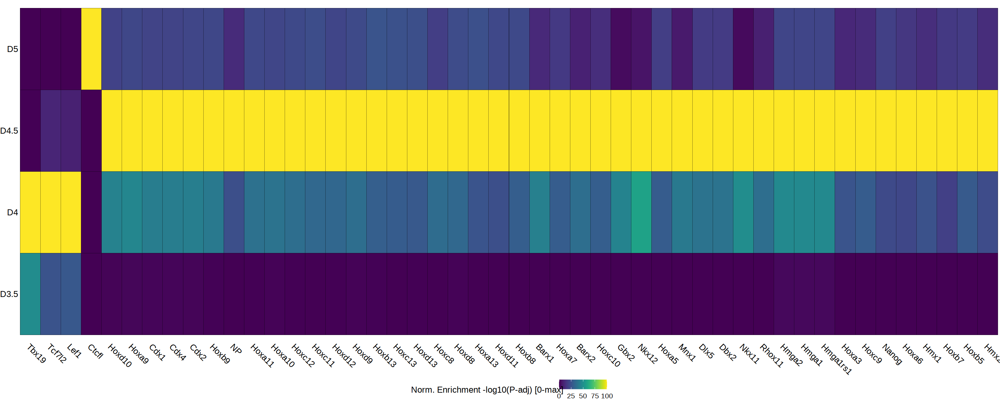

In [136]:
enrichMotifs <- peakAnnoEnrichment(
    seMarker = enrich_full,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_cisbp",
    cutOff = "FDR <= 0.05 & Log2FC >= 0.5"
  )
plot_enr_heatmap(enrichMotifs, ntop = 50)

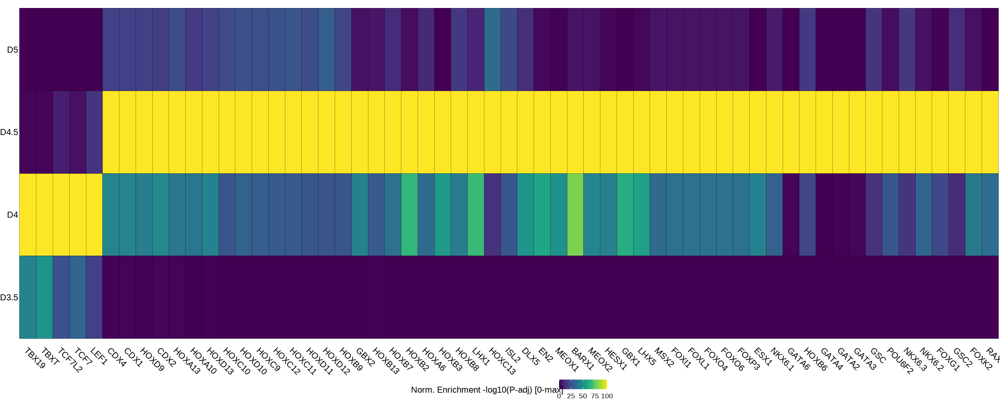

In [141]:
enrichMotifs <- peakAnnoEnrichment(
    seMarker = enrich_full,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_JASPAR2020",
    cutOff = "FDR <= 0.05 & Log2FC >= 0.5"
  )
plot_enr_heatmap(enrichMotifs, ntop = 50)

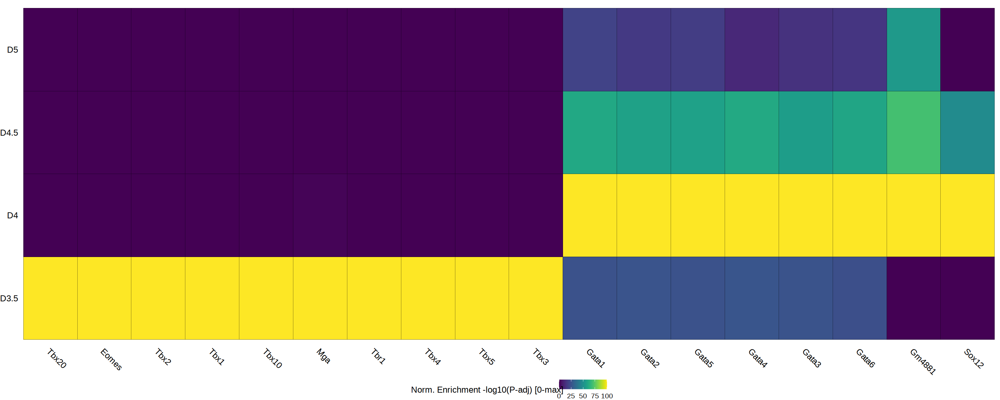

In [138]:
enrichMotifs <- peakAnnoEnrichment(
    seMarker = enrich_full,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_cisbp",
    cutOff = "FDR <= 0.05 & Log2FC <= -0.5"
  )
plot_enr_heatmap(enrichMotifs, ntop = 50)

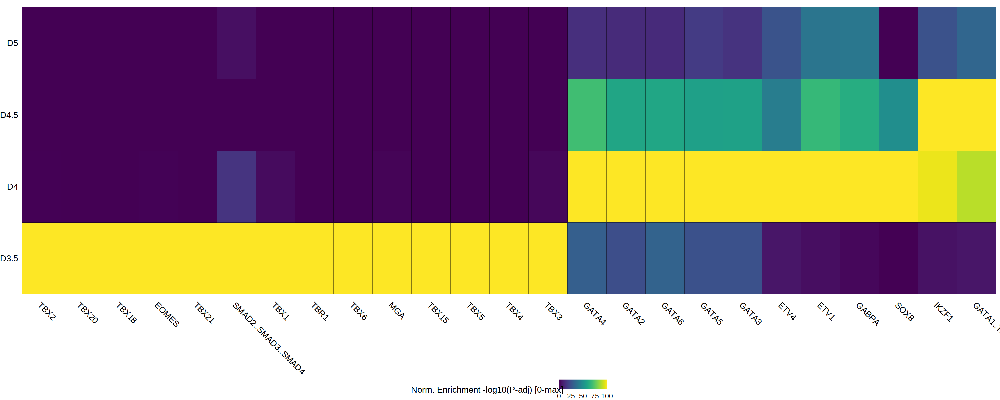

In [139]:
enrichMotifs <- peakAnnoEnrichment(
    seMarker = enrich_full,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_JASPAR2020",
    cutOff = "FDR <= 0.05 & Log2FC <= -0.5"
  )
plot_enr_heatmap(enrichMotifs, ntop = 50)

In [188]:
DARs$day = 'all'

In [196]:
enrich_full = list()
DARs_top = DARs[order(-abs(logFC))] %>% unique(by='idx')

tmp1 = merge(data.table(idx=1:nrow(peakset)), DARs_top, by='idx', all.x=T) %>%
                .[,c('Log2FC', 'FDR'):=list(ifelse(is.na(logFC), 0, logFC),
                                            ifelse(is.na(padj_fdr), 1, padj_fdr))]

tmp2 = markers
tmp2@assays@data$Log2FC = data.frame('x'=tmp1$Log2FC)
tmp2@assays@data$FDR = data.frame('x'=tmp1$FDR)
colnames(tmp2) = i

enrich_full[['all']] = tmp2

In [199]:
enrich_full = do.call('cbind', enrich_full)

In [204]:
enrichMotifs

class: SummarizedExperiment 
dim: 633 1 
metadata(0):
assays(10): mlog10Padj mlog10p ... CompareFrequency feature
rownames(633): FOXF2_1 FOXD1_2 ... ZNF263_632 CREM_633
rowData names(0):
colnames(1): all
colData names(0):

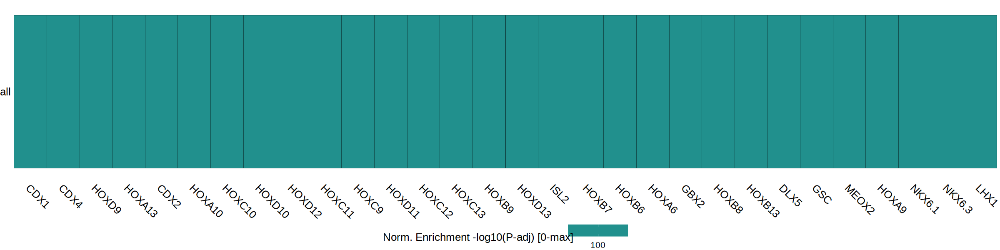

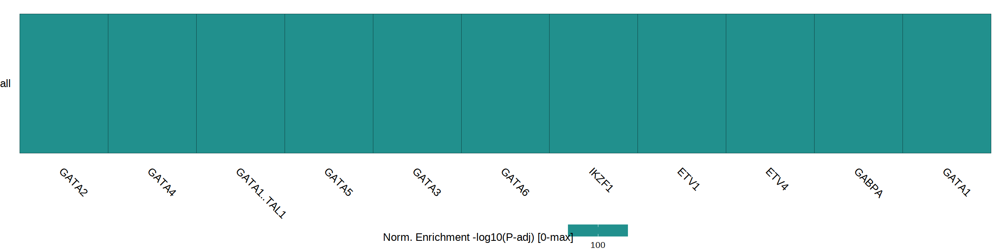

In [205]:
enrichMotifs <- peakAnnoEnrichment(
    seMarker = enrich_full,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_JASPAR2020",
    cutOff = "FDR <= 0.05 & Log2FC >= 0.5"
  )
ntop = 100
heatmapEM <- plotEnrichHeatmap(enrichMotifs, n = ntop, returnMatrix = TRUE)

enriched.dt = melt(as.data.table(heatmapEM, keep.rownames=T) %>% setnames('rn', 'TF'), id.vars = c("TF")) %>%
    .[order(-value)] %>%
    .[,TF:=strsplit(TF, '_') %>% map_chr(1)] %>%
    .[,TF:=factor(TF, levels=unique(TF))]


p = ggplot(enriched.dt, aes(TF, variable, fill=value)) + 
geom_tile(col='black') + 
viridis::scale_fill_viridis(name='Norm. Enrichment -log10(P-adj) [0-max]') + 
theme_void() + theme(text=element_text(size=15), 
                     axis.text.x=element_text(angle=-45,hjust=0,vjust=1), 
                     axis.text.y=element_text(hjust=1),
                    legend.position='bottom')
p

enrichMotifs <- peakAnnoEnrichment(
    seMarker = enrich_full,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_JASPAR2020",
    cutOff = "FDR <= 0.05 & Log2FC <= -0.5"
  )
ntop = 100
heatmapEM <- plotEnrichHeatmap(enrichMotifs, n = ntop, returnMatrix = TRUE)

enriched.dt = melt(as.data.table(heatmapEM, keep.rownames=T) %>% setnames('rn', 'TF'), id.vars = c("TF")) %>%
    .[order(-value)] %>%
    .[,TF:=strsplit(TF, '_') %>% map_chr(1)] %>%
    .[,TF:=factor(TF, levels=unique(TF))]


p = ggplot(enriched.dt, aes(TF, variable, fill=value)) + 
geom_tile(col='black') + 
viridis::scale_fill_viridis(name='Norm. Enrichment -log10(P-adj) [0-max]') + 
theme_void() + theme(text=element_text(size=15), 
                     axis.text.x=element_text(angle=-45,hjust=0,vjust=1), 
                     axis.text.y=element_text(hjust=1),
                    legend.position='bottom')
p

# non-celltype specific

In [33]:
table(ArchRProject@cellColData$day, ArchRProject@cellColData$genotype)

      
       eomes_ko    wt
  D3          0  4696
  D3.5     4677 10366
  D4       4700  4509
  D4.5     1751   479
  D5       1270   729

In [142]:
ArchRProject.filt = ArchRProject[ArchRProject@cellColData$day %in% c('D3.5', 'D4', 'D4.5', 'D5')]

In [143]:
out <- getMarkerFeatures( # suppressMessages(
  ArchRProj = ArchRProject.filt, 
  useMatrix = "PeakMatrix",
  groupBy = "genotype",
  testMethod = "binomial",
  binarize=TRUE,
  useGroups = 'eomes_ko',
  bgdGroups = 'wt',
  bias = c("TSSEnrichment", "log10(nFrags)"),
  verbose=TRUE
)

In [159]:
options(repr.plot.width=20, repr.plot.height=5) 


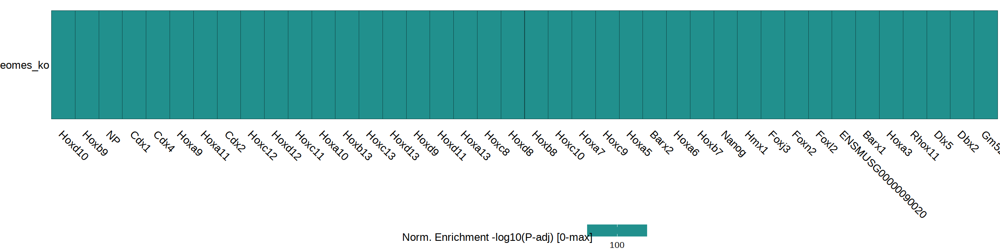

In [164]:
enrichMotifs <- peakAnnoEnrichment(
    seMarker = out,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_cisbp",
    cutOff = "FDR <= 0.05 & Log2FC >= 0.5"
  )

ntop = 50
heatmapEM <- plotEnrichHeatmap(enrichMotifs, n = ntop, returnMatrix = TRUE)

enriched.dt = melt(as.data.table(heatmapEM, keep.rownames=T) %>% setnames('rn', 'TF'), id.vars = c("TF")) %>%
    .[order(-value)] %>%
    .[,TF:=strsplit(TF, '_') %>% map_chr(1)] %>%
    .[,TF:=factor(TF, levels=unique(TF))]


p = ggplot(enriched.dt, aes(TF, variable, fill=value)) + 
geom_tile(col='black') + 
viridis::scale_fill_viridis(name='Norm. Enrichment -log10(P-adj) [0-max]') + 
theme_void() + theme(text=element_text(size=15), 
                     axis.text.x=element_text(angle=-45,hjust=0,vjust=1), 
                     axis.text.y=element_text(hjust=1),
                    legend.position='bottom')
p


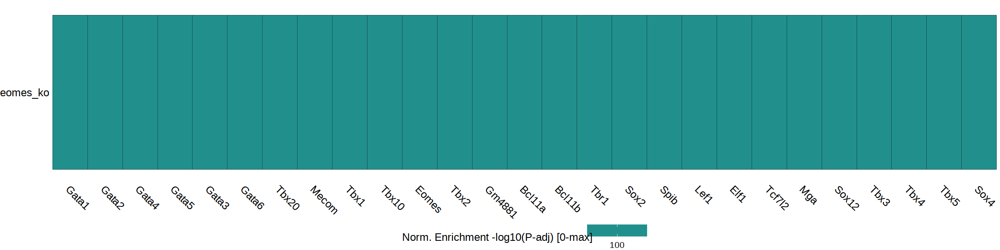

In [162]:
enrichMotifs <- peakAnnoEnrichment(
    seMarker = out,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_cisbp",
    cutOff = "FDR <= 0.05 & Log2FC <= -0.5"
  )

ntop = 100
heatmapEM <- plotEnrichHeatmap(enrichMotifs, n = ntop, returnMatrix = TRUE)

enriched.dt = melt(as.data.table(heatmapEM, keep.rownames=T) %>% setnames('rn', 'TF'), id.vars = c("TF")) %>%
    .[order(-value)] %>%
    .[,TF:=strsplit(TF, '_') %>% map_chr(1)] %>%
    .[,TF:=factor(TF, levels=unique(TF))]


p = ggplot(enriched.dt, aes(TF, variable, fill=value)) + 
geom_tile(col='black') + 
viridis::scale_fill_viridis(name='Norm. Enrichment -log10(P-adj) [0-max]') + 
theme_void() + theme(text=element_text(size=15), 
                     axis.text.x=element_text(angle=-45,hjust=0,vjust=1), 
                     axis.text.y=element_text(hjust=1),
                    legend.position='bottom')
p

In [212]:
umap = fread(file.path(io$basedir, 'results/atac/archR/dimensionality_reduction/cells/PeakMatrix/remove_ExE_cells_FALSE/batch_correction_None/umap_nfeatures25000_dims25_nneighbour25_mindist0.5.txt.gz'))
meta = fread(args$metadata)

In [209]:
head(umap)

cell,umap1,umap2
<chr>,<dbl>,<dbl>
1A_Eo_DEG_G9_day3#AAACAGCCAGCAAGAT-1,-9.72,2.08
1A_Eo_DEG_G9_day3#AAACAGCCAGCACCAT-1,-7.83,1.30
1A_Eo_DEG_G9_day3#AAACATGCAAGTAAGC-1,-10.20,1.52
1A_Eo_DEG_G9_day3#AAACATGCAATATACC-1,-8.52,2.70
1A_Eo_DEG_G9_day3#AAACATGCAATCCTGA-1,-9.12,3.35
1A_Eo_DEG_G9_day3#AAACATGCACTTAGGC-1,-7.90,2.83


In [214]:
head(meta)

cell,barcode,sample,nFeature_RNA,nCount_RNA,mitochondrial_percent_RNA,ribosomal_percent_RNA,alias,day,genotype,⋯,closest.cell,day_celltype,celltype_genotype,TSSEnrichment_atac,ReadsInTSS_atac,PromoterRatio_atac,NucleosomeRatio_atac,nFrags_atac,BlacklistRatio_atac,pass_atacQC
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>,<int>,<dbl>,<lgl>
1A_Eo_DEG_G9_day3#AAACAGCCAAGTGAAC-1,AAACAGCCAAGTGAAC-1,1A_Eo_DEG_G9_day3,602,1007,0.50,25.02,day3_wt_rep1,D3,wt,⋯,NA,D3-wt,NA-wt,NA,NA,NA,NA,NA,NA,FALSE
1A_Eo_DEG_G9_day3#AAACAGCCAGCAAGAT-1,AAACAGCCAGCAAGAT-1,1A_Eo_DEG_G9_day3,6110,22923,6.09,10.15,day3_wt_rep1,D3,wt,⋯,cell_85485,D3-wt,Epiblast-wt,14.25,5607,0.22,1.19,49080,0.02,TRUE
1A_Eo_DEG_G9_day3#AAACAGCCAGCACCAT-1,AAACAGCCAGCACCAT-1,1A_Eo_DEG_G9_day3,4201,10794,6.57,7.38,day3_wt_rep1,D3,wt,⋯,cell_88836,D3-wt,Primitive_Streak-wt,11.47,3998,0.17,1.56,46497,0.02,TRUE
1A_Eo_DEG_G9_day3#AAACATGCAACACCTA-1,AAACATGCAACACCTA-1,1A_Eo_DEG_G9_day3,680,1195,2.68,23.51,day3_wt_rep1,D3,wt,⋯,NA,D3-wt,NA-wt,NA,NA,NA,NA,NA,NA,FALSE
1A_Eo_DEG_G9_day3#AAACATGCAAGTAAGC-1,AAACATGCAAGTAAGC-1,1A_Eo_DEG_G9_day3,3659,8745,5.74,11.92,day3_wt_rep1,D3,wt,⋯,cell_1799,D3-wt,Epiblast-wt,14.70,10775,0.25,1.27,83426,0.02,TRUE
1A_Eo_DEG_G9_day3#AAACATGCAATATACC-1,AAACATGCAATATACC-1,1A_Eo_DEG_G9_day3,3640,8461,3.70,7.21,day3_wt_rep1,D3,wt,⋯,cell_43612,D3-wt,Primitive_Streak-wt,13.45,3349,0.21,1.48,30196,0.02,TRUE


In [215]:
meta = merge(meta, umap, by='cell')

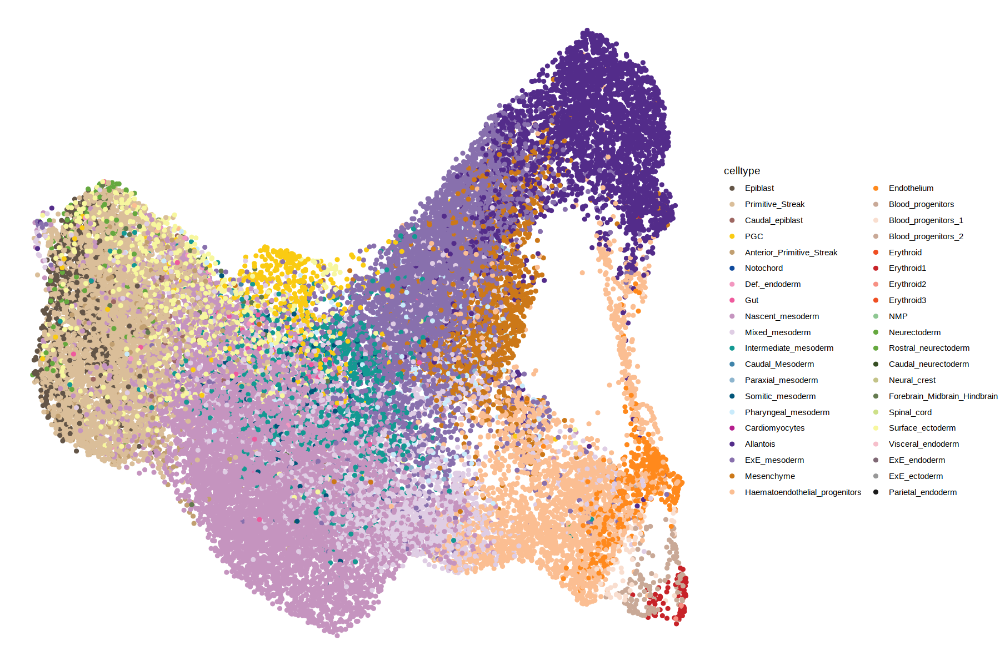

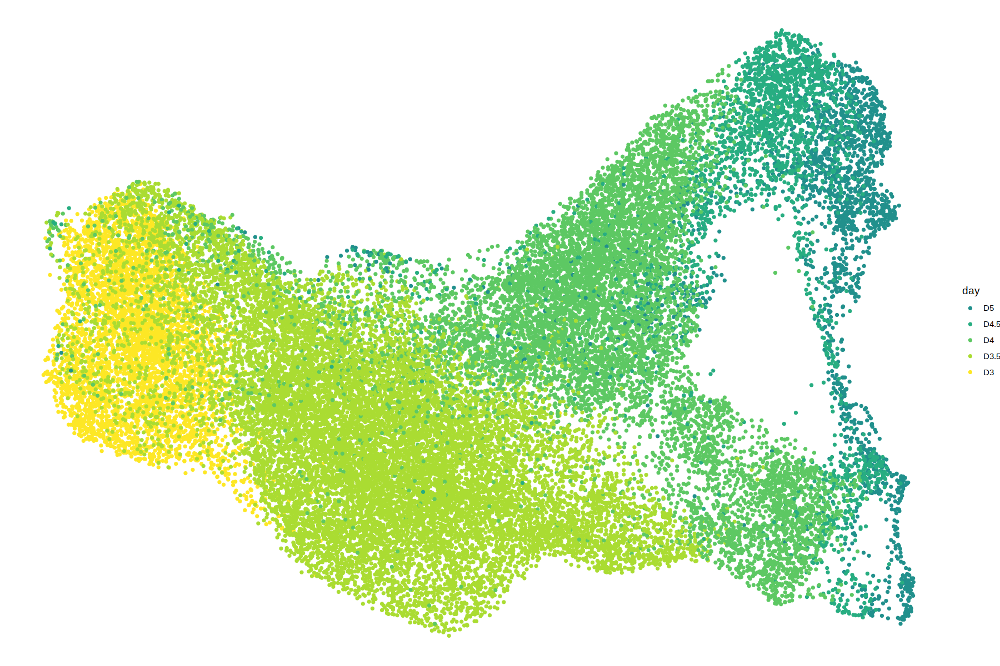

In [225]:
options(repr.plot.width=15, repr.plot.height=10)

ggplot(meta, aes(umap1, umap2, col=celltype)) +
    geom_point() +
    theme_void() + 
    scale_colour_manual(values=opts$celltype.colors)

ggplot(meta, aes(umap1, umap2, col=day)) +
    geom_point(size=1, alpha=1) +
    theme_void() + 
    scale_colour_manual(values=opts$days.colors)


In [226]:
unique(meta$genotype)

[1] "wt"       "eomes_ko"

In [228]:
opts$genotype.color

TRUE   FALSE 
  "red" "black"

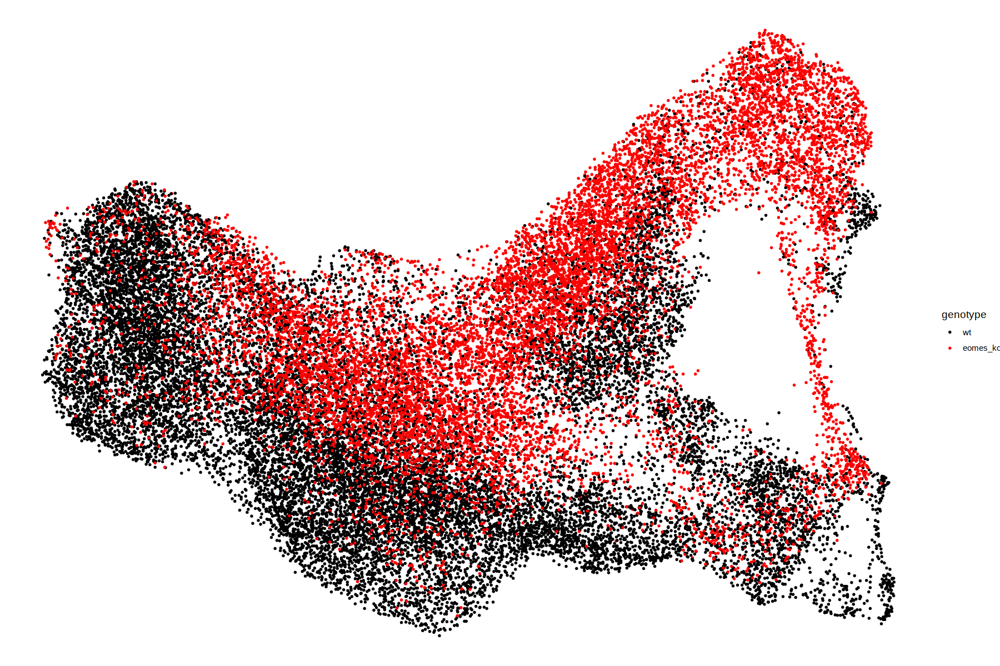

In [247]:

ggplot(meta, aes(umap1, umap2, col=genotype)) +
    geom_point(size=0.5, alpha=1) +
   # geom_density_2d() + 
    theme_void() + 
    scale_colour_manual(values=c('wt'='black', 'eomes_ko'='red'))

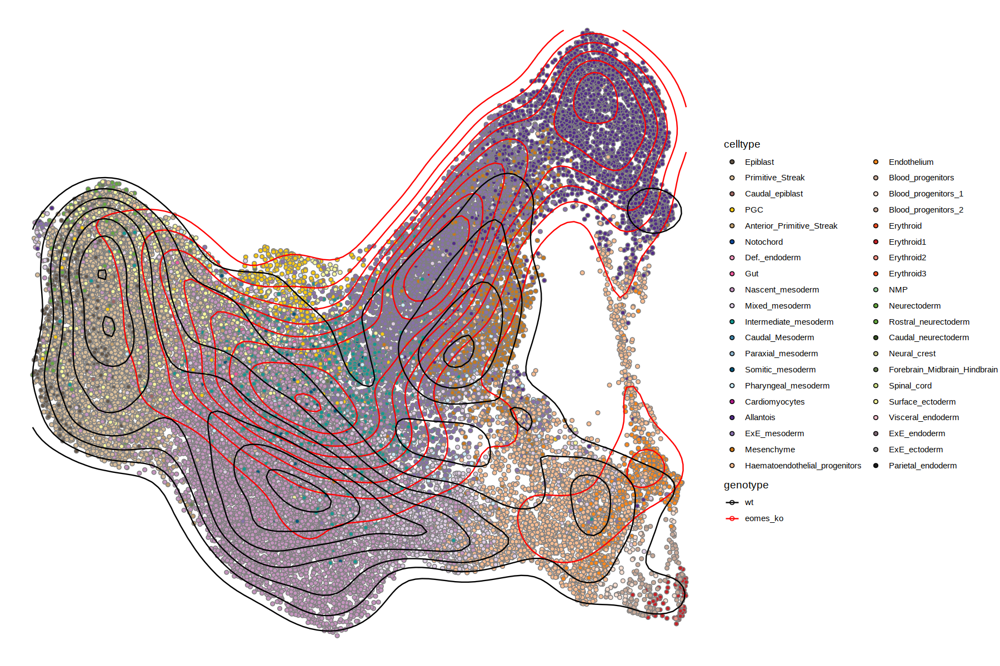

In [246]:

ggplot(meta, aes(umap1, umap2, col=genotype)) +
   # geom_point(size=0.5, alpha=1) +
    geom_point(aes(fill=celltype, col=NA), shape=21) +
    geom_density_2d() + 
    theme_void() + 
    scale_colour_manual(values=c('wt'='black', 'eomes_ko'='red')) +
    scale_fill_manual(values=opts$celltype.colors)